# Tutorial with LSST

We will use the parameter file "tests/parametersTest.cfg".
This contains a description of the bands and data to be used.
In this example we will generate mock data for the ugrizy LSST bands,
**fit each object with our GP using ugi bands only and see how it predicts the rz bands.**
This is an example for filling in/predicting missing bands in a fully bayesian way
with a flexible SED model quickly via our photo-z GP.

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats
import sys
sys.path.append('../')
from delight.io import *
from delight.utils import *
from delight.photoz_gp import PhotozGP

In [2]:
%cd /Users/sylvie/MacOSX/GitHub/LSST/Delight

/Users/sylvie/MacOSX/GitHub/LSST/Delight


In [3]:
%mkdir tests_lsst

mkdir: tests_lsst: File exists


In [4]:
%mkdir data_lsst

mkdir: data_lsst: File exists


## Creating the parameter file
Let's create a parameter file from scratch.

In [5]:
paramfile_txt = """
# DELIGHT parameter file
# Syntactic rules:
# - You can set parameters with : or =
# - Lines starting with # or ; will be ignored
# - Multiple values (band names, band orders, confidence levels)
#   must beb separated by spaces
# - The input files should contain numbers separated with spaces.
# - underscores mean unused column
"""

Let's describe the bands we will use. This must be a superset (ideally the union) of all the bands involved in the training and target sets, including cross-validation. 

Each band should have its own file, containing a tabulated version of the filter response.

See example files shipped with the code for formatting.

In [6]:
paramfile_txt += """
[Bands]
names: lsst_u lsst_g lsst_r lsst_i lsst_z lsst_y
directory: data/FILTERS
"""

Let's now describe the system of SED templates to use (needed for the mean fct of the GP, for simulating objects, and for the template fitting routines).

Each template should have its own file (see shipped files for formatting example). 

- **lambdaRef** will be the pivot wavelenght used for normalizing the templates.

- **$p(z|t)$ and $p(t)$** containts parameters for the priors of each template, for $p(z|t) p(t)$. 

- Calibrating those numbers will be the topic of another tutorial.

By default the set of templates and the prior calibration can be left untouched.

In [7]:
paramfile_txt += """
[Templates]
directory: ./data/CWW_SEDs
names: El_B2004a Sbc_B2004a Scd_B2004a SB3_B2004a SB2_B2004a Im_B2004a ssp_25Myr_z008 ssp_5Myr_z008
p_t: 0.27 0.26 0.25 0.069 0.021 0.11 0.0061 0.0079
p_z_t:0.23 0.39 0.33 0.31 1.1 0.34 1.2 0.14
lambdaRef: 4.5e3
"""

The next section if for simulating a photometric catalogue from the templates. 

- **catalog files** (trainingFile, targetFile) will be created, and have the adequate format for the later stages. 

- **noiseLevel** describes the relative error for the absolute flux in each band.

In [8]:
paramfile_txt += """
[Simulation]
numObjects: 1000
noiseLevel: 0.03
trainingFile: data_lsst/galaxies-fluxredshifts.txt
targetFile: data_lsst/galaxies-fluxredshifts2.txt
"""

We now describe the training file.

- `catFile` is the input catalog. This should be a tab or space separated file with numBands + 1 columns.

- `bandOrder` describes the ordering of the bands in the file. Underscore `_` means an ignored column, for example a band that shouldn't be used. The band names must correspond to those in the filter section.

- `redshift` is for the photometric redshift. 
- `referenceBand` is the reference band for normalizing the fluxes and luminosities. 
- `extraFracFluxError` is an extra relative error to add in quadrature to the flux errors.

- `paramFile` will contain the output of the GP applied to the training galaxies, i.e. the minimal parameters that must be stored in order to reconstruct the fit of each GP.

- `crossValidate` is a flag for performing optional cross-validation. If so, `CVfile` will contain cross-validation data. `crossValidationBandOrder` is similar to `bandOrder` and describes the bands to be used for cross-validation. In this example I have left the R band out of `bandOrder` and put it in `crossValidationBandOrder`. However, this feature won't work on simulated data, only on real data (i.e., the `simulateWithSEDs` script below does not generate cross-validation bands).

- `numChunks` is the number of chunks to split the training data into. At present please stick to 1.

In [9]:
paramfile_txt += """
[Training]
catFile: data_lsst/galaxies-fluxredshifts.txt
bandOrder: lsst_u lsst_u_var lsst_g lsst_g_var _ _ lsst_i lsst_i_var lsst_z lsst_z_var lsst_y lsst_y_var redshift
referenceBand: lsst_i
extraFracFluxError: 1e-4
paramFile: data_lsst/galaxies-gpparams.txt
crossValidate: False
CVfile: data_lsst/galaxies-gpCV.txt
crossValidationBandOrder: _ _ _ _ lsst_r lsst_r_var _ _ _ _ _ _
numChunks: 1
"""

The section of the target catalog has very similar structure and parameters. The `catFile`, `bandOrder`, `referenceBand`, and `extraFracFluxError` have the same meaning as for the training, but of course don't have to be the same.

- `redshiftpdfFile` and `redshiftpdfFileTemp` will contain tabulated redshift posterior PDFs for the delight-apply and templateFitting scripts. 

- Similarly, `metricsFile` and `metricsFileTemp` will contain metrics calculated from the PDFs, like mean, mode, etc. This is particularly informative if `redshift` is also provided in the target set.

- The compression mode can be activated with `useCompression` and will produce new redshift PDFs in the file `redshiftpdfFileComp`, while `compressIndicesFile` and `compressMargLikFile` will contain the indices and marginalized likelihood for the objects that were kept during compression. The number of objects is controled with `Ncompress`.

In [10]:
paramfile_txt += """
[Target]
catFile: data_lsst/galaxies-fluxredshifts2.txt
bandOrder: lsst_u lsst_u_var lsst_g lsst_g_var lsst_r lsst_r_var _ _ lsst_z lsst_z_var lsst_y lsst_y_var redshift
referenceBand: lsst_r
extraFracFluxError: 1e-4
redshiftpdfFile: data_lsst/galaxies-redshiftpdfs.txt
redshiftpdfFileTemp: data_lsst/galaxies-redshiftpdfs-cww.txt
metricsFile:  data_lsst/galaxies-redshiftmetrics.txt
metricsFileTemp:  data_lsst/galaxies-redshiftmetrics-cww.txt
useCompression: False
Ncompress: 10
compressIndicesFile: data_lsst/galaxies-compressionIndices.txt
compressMargLikFile: data_lsst/galaxies-compressionMargLikes.txt
redshiftpdfFileComp: data_lsst/galaxies-redshiftpdfs-comp.txt
"""

Finally, there are various other parameters related to the method itself.

- The (hyper)parameters of the Gaussian process are `zPriorSigma`, `ellPriorSigma` (locality of the model predictions in redshift and luminosity), `fluxLuminosityNorm` (some normalization parameter), `alpha_C`, `alpha_L`, `V_C`, `V_L` (smoothness and variance of the latent SED model), `lines_pos`, `lines_width` (positions and widths of the lines in the latent SED model). 

- `redshiftMin`, `redshiftMax`, and `redshiftBinSize` describe the linear fine redshift grid to compute PDFs on.

- `redshiftNumBinsGPpred` describes the granuality (in log scale!) for the GP kernel to be exactly calculated on; it will then be interpolated on the finer grid.

- `redshiftDisBinSize` is the binsize for a tomographic redshift binning.

- `confidenceLevels` are the confidence levels to compute in the redshift PDF metrics.

The values below should be a good default set for all of those parameters. 

In [11]:
paramfile_txt += """
[Other]
rootDir: ./
zPriorSigma: 0.2
ellPriorSigma: 0.5
fluxLuminosityNorm: 1.0
alpha_C: 1.0e3
V_C: 0.1
alpha_L: 1.0e2
V_L: 0.1
lines_pos: 6500 5002.26 3732.22
lines_width: 20.0 20.0 20.0
redshiftMin: 0.1
redshiftMax: 1.101
redshiftNumBinsGPpred: 100
redshiftBinSize: 0.001
redshiftDisBinSize: 0.2
confidenceLevels: 0.1 0.50 0.68 0.95
"""

In [12]:
with open('tests_lsst/parametersTest.cfg','w') as out:
    out.write(paramfile_txt)

## Running Delight

### Processing the filters and templates, and create a mock catalog

- First, we must fit the band filters with a gaussian mixture. 
This is done with this script:

In [13]:
%run ./scripts/processFilters.py tests_lsst/parametersTest.cfg

lsst_u lsst_g lsst_r 

/Users/sylvie/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:475: RuntimeWarning: Number of calls to function has reached maxfev = 3000.
  warnings.warn(errors[info][0], RuntimeWarning)


lsst_i lsst_z lsst_y 

- Second, we will process the library of SEDs and project them onto the filters,
(for the mean fct of the GP) with the following script (which may take a few minutes depending on the settings you set):

In [14]:
%run ./scripts/processSEDs.py tests_lsst/parametersTest.cfg

- Third, we will make some mock data with those filters and SEDs:

produce files `galaxies-redshiftpdfs.txt` and `galaxies-redshiftpdfs2.txt` for trainning and target

In [17]:
%run ./scripts/simulateWithSEDs.py tests_lsst/parametersTest.cfg

### Train and apply
Run the scripts below. There should be a little bit of feedback as it is going through the lines.
For up to **1e4 objects** it should only take a few minutes max, depending on the settings above.

In [18]:
%run ./scripts/templateFitting.py tests_lsst/parametersTest.cfg

--- TEMPLATE FITTING ---
Thread number / number of threads:  1 1
Input parameter file: tests_lsst/parametersTest.cfg
Number of Target Objects 1000
Thread  0  analyzes lines  0  to  1000


/Users/sylvie/MacOSX/GitHub/LSST/Delight/scripts/templateFitting.py:45: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  numObjectsTarget = np.sum(1 for line in open(params['target_catFile']))


In [19]:
%run ./scripts/delight-learn.py tests_lsst/parametersTest.cfg

--- DELIGHT-LEARN ---
Number of Training Objects 1000
Thread  0  analyzes lines  0  to  1000


/Users/sylvie/MacOSX/GitHub/LSST/Delight/scripts/delight-learn.py:29: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  numObjectsTraining = np.sum(1 for line in open(params['training_catFile']))


In [28]:
%run ./scripts/delight-apply.py tests_lsst/parametersTest.cfg

--- DELIGHT-APPLY ---
Number of Training Objects 1000
Number of Target Objects 1000
Thread  0  analyzes lines  0  to  1000


/Users/sylvie/MacOSX/GitHub/LSST/Delight/scripts/delight-apply.py:45: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  numObjectsTraining = np.sum(1 for line in open(params['training_catFile']))
/Users/sylvie/MacOSX/GitHub/LSST/Delight/scripts/delight-apply.py:46: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  numObjectsTarget = np.sum(1 for line in open(params['target_catFile']))


None band 0 y_pred_bin [769.21852258 727.86247568 688.76499767 651.97951402 617.20853288
 584.38270119 553.33970386 523.90735635 496.04396235 469.65050784
 444.60588146 420.83194082 398.26991194 376.87148246 356.57483768
 337.32310988 319.10112815 301.82560612 285.46651    269.98621227
 255.32623731 241.44874354 228.31487999 215.88612865 204.13695214
 193.01679954 182.498173   172.54805283 163.14144753 154.24364083
 145.82761427 137.86736352 130.33743621 123.21661719 116.48034672
 110.10812708 104.07845852  98.37390855  92.97836406  87.87480129
  83.0484774   78.48677865  74.17708564  70.10711568  66.26402904
  62.63611017  59.21327889  55.98390154  52.93906088  50.06880842
  47.36419997  44.8160683   42.4151423   40.15352154  38.02392079
  36.0197182   34.13349572  32.35825789  30.68776302  29.11611816
  27.63716693  26.24566844  24.93622004  23.70381729  22.54358506
  21.45070243  20.42127235  19.4510154   18.53606239  17.67278448
  16.85780353  16.08783365  15.35968615  14.6708289  

   27.20134577   25.50192282   24.38635069   23.25643219   21.87991453] y_var_bin [ 1.70197356e-02  1.99945134e-02  1.57295780e-02  1.51276124e-02
  1.64797628e-02  1.56735255e-02  8.12844969e-03  1.14894108e-02
  8.41337305e-03  6.24035394e-03  3.62373927e-09 -3.55683910e-09
  1.25330346e-02  7.33167615e-03  5.89567190e-03  3.95292605e-03
  5.36914752e-03  3.09472148e-04  2.22936097e-03  2.01052268e-03
  2.23451632e-03  1.85157932e-03  2.63588064e-03  1.89346129e-03
  1.48194405e-03  1.34605355e-03  1.18506464e-03  1.11721651e-03
  8.55831309e-04  1.09302034e-03  9.83158018e-04  1.08955719e-03
  8.40941150e-04  2.34847199e-04  5.12683421e-04  4.62967225e-04
  4.18106834e-04  3.77625596e-04  3.41093792e-04  1.54357126e-04
  3.62369490e-04  3.99072148e-04  3.87678570e-04  8.50080921e-05
  3.13012753e-04  1.81142275e-04  1.05441605e-04  1.53200534e-04
  1.35091513e-04  1.88031717e-05  4.31165749e-05  9.35892768e-05
  1.42108181e-04  7.98524219e-05  1.35514369e-04  6.14587779e-05
  5.5624

None band 0 y_pred_bin [774.60623834 732.9592025  693.58915149 656.54480606 621.53131393
 588.47566336 557.21516207 527.57677569 499.5181346  472.93982668
 447.71979382 423.77934628 401.05929849 379.51099971 359.0722023
 339.68564025 321.33603644 303.93952113 287.46585021 271.87713262
 257.11448317 243.13979527 229.91394581 217.39814703 205.56668269
 194.36864781 183.77635195 173.75654415 164.28405788 155.32393372
 146.84896397 138.83296216 131.25029768 124.07960677 117.29615768
 110.87930913 104.80741078  99.06290806  93.629575    88.49026861
  83.6301428   79.03649547  74.69661885  70.59814422  66.72814193
  63.07481439  59.62801079  56.37601601  53.30985034  50.41949564
  47.69594505  45.12996715  42.71222589  40.43476552  38.29024976
  36.27201041  34.37257745  32.58490642  30.90271193  29.32005976
  27.8307504   26.42950625  25.11088682  23.86985264  22.70149441
  21.60095747  20.56431746  19.587265    18.66590379  17.79657958
  16.97589057  16.20052785  15.46728041  14.77359838  

  1.09542825e-06  9.98075032e-07  9.09526939e-07  8.28973734e-07]
None band 0 y_pred_bin [765.42136909 724.2690678  685.36468598 648.76069433 614.16132971
 581.49756163 550.60782592 521.32078815 493.59495783 467.33180982
 442.41083069 418.75426384 396.30362547 375.01084172 354.8144031
 335.65772262 317.52570429 300.33547292 284.057143   268.65327278
 254.06567533 240.2566959  227.18767534 214.82028579 203.12911595
 192.06386449 181.59716932 171.69617375 162.33600968 153.48213222
 145.10765632 137.18670603 129.69395464 122.60829174 115.90527884
 109.56451943 103.56461989  97.8882338   92.51932761  87.44096161
  82.63846573  78.09928851  73.81087286  69.76099672  65.93688375
  62.32687627  58.92094382  55.7075102   52.67769827  49.82162043
  47.13036487  44.59481356  42.20574113  39.95528619  37.83619945
  35.84189176  33.9649817   32.19850835  30.53626083  28.97237528
  27.50072573  26.11609715  24.81311356  23.58679523  22.43229111
  21.34480407  20.32045632  19.35498954  18.44455366  

  1.07320131e-06  9.77927622e-07  8.91260978e-07  8.12410296e-07]
None band 2 y_pred_bin [2460.5442815  2336.87990848 2218.84783105 2107.04758437 2000.57978927
 1899.23743667 1803.29378544 1712.24761626 1625.67337679 1543.72662323
 1465.99874861 1392.11535219 1321.7535106  1254.58851214 1190.89595183
 1130.54417785 1073.45739729 1019.37219459  967.95568654  919.13930875
  872.84742984  828.90599243  786.96133778  747.18849173  709.57347865
  673.76459498  639.5615685   607.18556019  576.37244085  547.20297226
  519.47479199  493.11758762  468.16600616  444.50643617  422.02483164
  400.74258327  380.6611337   361.5933638   343.57356254  326.54119688
  310.34394965  295.3524445   280.89346258  266.96295275  253.95058013
  241.54048674  229.56482291  218.01417925  207.07610353  196.66675521
  186.6882202   177.17784253  168.06248089  159.31632971  150.88675736
  142.80084596  135.02052104  127.46361874  120.28160734  113.35169094
  106.86410745  100.58743036   94.78153462   89.20129587   

None band 0 y_pred_bin [1330.82497491 1259.20662394 1193.33101664 1133.34022192 1077.01757112
 1023.619471    972.71485618  924.63615499  878.25605399  833.43293048
  792.5726055   754.12117023  715.47143683  680.50634679  646.96625344
  614.1075975   583.95266327  554.80579382  526.47185287  499.78278796
  474.5094849   450.65867068  427.42578746  402.75738108  380.93120587
  361.8452967   341.02394171  322.6019343   302.69761334  286.43157734
  269.99344511  255.71287684  241.09973987  228.35296233  217.22588219
  206.22553341  195.057109    185.89068839  176.7244266   168.79749369
  160.84028478  153.0735504   146.59162707  139.65964052  133.6146381
  127.56656448  121.98725005  116.49384947  111.42725549  106.60746524
  102.01085017   97.64691927   93.4039913    89.36258029   85.44489954
   81.58198356   78.0211348    74.52422947   71.2541612    68.42946994
   65.4563039    62.74570279   60.162325     57.52162012   54.9290219
   52.36958676   49.97770876   47.64225576   45.48493076

None band 1 y_pred_bin [2034.73670682 1923.92802936 1818.0879155  1717.51597603 1621.79861905
 1531.25451351 1446.08801038 1366.0221817  1290.78977668 1219.9953603
 1153.21936078 1090.19350642 1030.78668429  974.89160261  922.10391428
  872.02875076  824.64267909  779.85794318  737.6518465   697.85822841
  660.21009291  624.54345346  590.72476732  558.64185978  528.23380805
  499.38698084  472.04883937  446.13326792  421.58231249  398.32219051
  376.29579163  355.43040828  335.65522542  316.92063866  299.1779375
  282.38640765  266.50591221  251.49783934  237.3183115   223.92388961
  211.24764788  199.24685176  187.9114808   177.18780151  167.03510085
  157.43463852  148.33856953  139.70532233  131.52573081  123.78662783
  116.45479349  109.52637487  102.99282908   96.82822975   91.02529749
   85.58943084   80.49064429   75.70308304   71.23150021   67.04755914
   63.109318     59.33211026   55.69323715   52.20946811   48.84638298
   45.68487968   42.82590543   40.40397864   38.31968361

None band 0 y_pred_bin [1519.95942661 1448.15995451 1379.89025671 1315.37122382 1253.61120938
 1194.74390501 1139.08462007 1086.20272227 1035.8418572   988.08269912
  942.73383065  899.42036984  858.08492172  818.75594864  781.39284257
  745.83823351  712.06399888  679.78155839  648.9299692   619.60938743
  591.83867854  565.27914638  539.88905022  515.76332567  492.7304598
  470.82755172  449.86811247  429.90124052  410.9127461   392.82250773
  375.57614131  359.05409478  343.28671015  328.31011178  313.99832623
  300.34435154  287.36169901  274.99062588  263.16083617  251.87146338
  241.12914739  230.85192163  221.02996639  211.63637128  202.64374617
  194.04211941  185.82197351  177.96616283  170.4602207   163.28788703
  156.43817042  149.9074522   143.65834554  137.68491835  131.9953643
  126.54924416  121.34027844  116.40213287  111.65574629  107.20854508
  102.94349474   98.92446838   95.07774853   91.39173256   87.88188698
   84.49310447   81.24621583   78.13585148   75.17630188

   9.03933364   8.64234744   8.25799116   7.88596922   7.52395498] y_var_bin [ 4.47851791e-07  1.10458312e-02  1.02222242e-02  2.92525862e-03
  1.42450502e-02  6.05053448e-03  5.45680759e-03  1.94058628e-03
  2.59788933e-03  4.74073609e-03  1.46627743e-03  2.84492697e-03
  3.54326709e-03  5.93062706e-03  8.38946096e-03 -2.43703884e-08
  3.37684305e-03  3.34971343e-03  2.69527863e-03  3.02083344e-03
  1.93520984e-03  1.76805485e-03  2.49206391e-03  4.95922929e-04
  1.57645082e-03  8.43303358e-04  6.94126972e-04  5.81325791e-10
  2.86391695e-04  4.91572484e-04  6.12308775e-04  9.15603042e-08
  3.11047483e-04  3.35091234e-04  1.16383802e-07  2.29573919e-08
  3.23794437e-04  2.52987517e-04  3.11670565e-04  2.38202674e-04
  3.62732274e-04  3.27533088e-04  4.32309013e-09  8.95902568e-09
  1.46049799e-04  1.08582295e-04  2.74416888e-09  1.55387612e-04
  1.21555401e-04  8.79737751e-05  8.51774443e-05  7.18698904e-05
  1.25810578e-09  5.87418842e-05  5.20054317e-05  9.15336050e-05
  4.76835414e

None band 0 y_pred_bin [1333.63291403 1261.8639461  1195.84873293 1135.73184742 1079.29008789
 1025.77931751  974.76729371  926.5871462   880.10918296  835.19148245
  794.24494194  755.71237391  716.98108938  681.94222278  648.33135963
  615.40337174  585.1848104   555.97644087  527.58271514  500.83733613
  475.51070624  451.60956663  428.32766188  403.60720506  381.73497649
  362.60879589  341.74350774  323.28262976  303.3363106   287.03595313
  270.56313633  256.25243592  241.60846511  228.83479174  217.6842333
  206.66067365  195.46868374  186.28292183  177.09731801  169.1536602
  161.1796614   153.39653912  146.90093879  139.95432562  133.8965681
  127.83573292  122.24464601  116.73965424  111.66236963  106.83240951
  102.22609547   97.85295656   93.60107591   89.55113742   85.62519026
   81.75412344   78.1857612    74.68147731   71.4045091    68.57385766
   65.59441816   62.8780976    60.2892688    57.64299196   55.04492329
   52.48008768   50.08316275   47.74278189   45.58090487 

   15.90209927   15.24667487   14.61904659   14.02897263   13.48364891] y_var_bin [ 1.58609938e-02  1.81966560e-02  1.44900603e-02 -1.18745241e-07
 -4.65310702e-08  1.14676132e-03  2.04908996e-03  2.75253003e-03
  2.83596661e-03  1.57162524e-02  2.94329706e-03  3.05221930e-03
  4.62139228e-03  2.59155529e-03  2.23979558e-03  2.02037956e-03
  3.55682172e-03 -1.88659283e-08 -1.29145182e-08  5.34133926e-04
  2.57137978e-03  7.43570270e-04  1.63954271e-03  1.01006220e-03
  9.11462896e-04  9.32325493e-04  1.05902221e-03  9.55912064e-04
  8.62899110e-04  7.78989107e-04  7.03287875e-04  6.34989228e-04
  5.73366309e-04  5.17763785e-04  4.67590807e-04  4.22314656e-04
  3.81455027e-04  3.44578858e-04  3.11295689e-04  2.81253458e-04
  2.54134723e-04  2.29653252e-04  2.07550951e-04  1.87595089e-04
  1.69575805e-04  1.53303850e-04  1.38608556e-04  1.25336013e-04
  1.13347409e-04  1.02517551e-04  9.27335222e-05  8.38934736e-05
  7.59055387e-05  6.86868500e-05  6.21626534e-05  5.62655086e-05
  5.0934

None band 3 y_pred_bin [1251.18577088 1193.54377638 1138.50767349 1086.24048929 1036.41405324
  988.96142416  943.89912257  901.03905358  860.30890453  821.54800522
  784.64871728  749.46254644  715.97121088  684.21234014  653.94453645
  624.99910447  597.39258524  571.06763168  546.01770002  522.69411629
  499.73129366  477.76327339  456.84949723  437.03669929  418.20039241
  400.20960153  383.10316002  366.85461878  351.38991985  336.61772152
  322.54543145  309.13819042  296.28398978  284.03691357  272.3832066
  261.32914901  250.7674915   240.67817931  231.07289683  221.9129655
  213.15470031  204.79004287  196.78227124  189.14327578  181.90595022
  174.91448783  168.22477794  161.93654629  155.91765852  150.15785939
  144.65983838  139.3949292   134.35060704  129.55715447  124.95595525
  120.52367524  116.26590457  112.20055136  108.29673231  104.48669528
  100.90480419   97.45434266   94.26776003   91.22250215   88.32993815
   85.56706706   82.96215651   80.46811801   78.10133474

None band 1 y_pred_bin [2053.50508677 1941.67387525 1834.85808283 1733.35820175 1636.75819293
 1545.3786879  1459.42661338 1378.62226186 1302.69591744 1231.24849758
 1163.85656035 1100.2493595  1040.29457273  983.88391862  930.60932034
  880.07226705  832.24910967  787.05128266  744.45588015  704.29520884
  666.29980994  630.30418429  596.17355736  563.79471974  533.10618669
  503.9932788   476.40297267  450.24835824  425.47094697  401.9962757
  379.76670732  358.70886359  338.75127629  319.84388347  301.93752533
  284.99111203  268.96413647  253.81763063  239.50731227  225.98934162
  213.19617556  201.08468537  189.64475816  178.82216483  168.57581676
  158.88680084  149.70683072  140.99395141  132.73891226  124.92842466
  117.52896232  110.53663675  103.94282629   97.72136541   91.86490759
   86.37890116   81.23308403   76.4013629    71.88853476   67.66600156
   63.6914346    59.87938637   56.20694873   52.6910458    49.29693994
   46.10627528   43.22093018   40.77666389   38.6731436

None band 0 y_pred_bin [1514.49324291 1442.95194022 1374.92764904 1310.64056344 1249.10285474
 1190.44721927 1134.98810421 1082.29638784 1032.11663768  984.52923789
  939.34345948  896.18576866  854.99897689  815.81144416  778.58270852
  743.15596591  709.50319488  677.33685296  646.59621648  617.38108139
  589.71024533  563.24623015  537.94744527  513.90848488  490.95845287
  469.13431494  448.25025277  428.35518829  409.43498275  391.40980283
  374.22546001  357.76283216  342.05215217  327.12941451  312.86909878
  299.26422819  286.32826546  274.00168268  262.21443642  250.96566407
  240.26198043  230.02171525  220.23508285  210.87527005  201.91498521
  193.34429257  185.15370885  177.32615007  169.8472016   162.70066182
  155.87557886  149.36834707  143.14171406  137.18976909  131.52067636
  126.09414208  120.90390931  115.98352276  111.25420555  106.82299777
  102.57328577   98.56871297   94.73582703   91.06306701   87.56584382
   84.1892483    80.95403637   77.85485775   74.905951

   40.08669354   39.04493309   38.05484641   37.15445577   36.31457461] y_var_bin [ 1.69135247e-02  1.60332677e-02  1.24286712e-02  1.44808757e-02
 -4.94502850e-08 -4.01661346e-08 -4.53344123e-08  1.60064719e-03
  1.75171865e-03  1.56042667e-02  1.62419772e-03  2.30339888e-03
  2.80563476e-03  3.05472534e-03  3.15214659e-03  3.07631160e-03
  3.16657474e-03  2.85683179e-03  2.57740279e-03  2.32531188e-03
  1.88563381e-03  1.89290769e-03  3.12430261e-03  2.68523617e-03
  2.88531099e-03  9.73633313e-04  9.53029006e-04  2.18535105e-03
  7.76288070e-04  7.00682562e-04  6.32472662e-04  5.70966744e-04
  5.37339923e-04  4.65399264e-04  3.87595396e-04  3.50020295e-04
  5.71277518e-04 -9.12616185e-10  3.52056259e-04  3.13123698e-04
  3.19998070e-04  2.47201880e-04  2.94882272e-04  2.90430989e-04
  1.20141187e-04  4.00923489e-04  1.48018713e-04  1.43904094e-04
  3.19851820e-04  2.56696596e-04  7.99631295e-05  1.11673190e-04
  9.14553881e-05  2.04186680e-05  5.47461691e-05 -1.56665421e-10
  5.5548

None band 0 y_pred_bin [562.99066608 530.08003123 498.97844628 469.7377545  442.10967992
 416.05273638 391.46208231 368.19105784 346.21248956 325.47639701
 305.87387606 287.33023309 269.80504966 253.24757828 237.61661947
 222.88778083 209.0461633  196.02203479 183.79578253 172.32352027
 161.55567082 151.45852948 141.99243374 133.1211423  124.81563937
 117.03124228 109.74283831 102.92033932  96.53924831  90.5682502
  84.9824861   79.75855075  74.8734832   70.30702738  66.03739598
  62.04593806  58.31290463  54.82217307  51.55762201  48.50311017
  45.64532368  42.97137917  40.46874534  38.12594375  35.93106969
  33.87412726  31.94603375  30.13748225  28.44041017  26.84726626
  25.35126688  23.94548771  22.62385357  21.38077344  20.21126125
  19.11052027  18.07395397  17.09710614  16.17583802  15.30660409
  14.48570106  13.71030464  12.97753483  12.28464922  11.62922099
  11.00904587  10.42229199   9.86718207   9.34195958   8.845251
   8.37564682   7.93194504   7.51297262   7.11754974   6

   16.24385891   15.57434846   14.93323151   14.33047598   13.77343245] y_var_bin [ 1.65502833e-02  1.89872593e-02  1.51196438e-02 -9.03484586e-09
 -1.99919427e-08  1.19661280e-03  2.13814102e-03  2.87214010e-03
  2.95919965e-03  1.63990709e-02  3.07118960e-03  3.18484245e-03
  4.82218710e-03  2.70416202e-03  2.33711879e-03  2.10816906e-03
  3.71136128e-03 -8.08922303e-09 -2.77382030e-09  5.57349381e-04
  2.68310312e-03  7.75883267e-04  1.71078080e-03  1.05395175e-03
  9.51068212e-04  9.72836674e-04  1.10503728e-03  9.97447049e-04
  9.00392716e-04  8.12836845e-04  7.33846406e-04  6.62580185e-04
  5.98279745e-04  5.40261281e-04  4.87908271e-04  4.40664852e-04
  3.98029849e-04  3.59551386e-04  3.24822037e-04  2.93474443e-04
  2.65177370e-04  2.39632151e-04  2.16569476e-04  1.95746504e-04
  1.76944254e-04  1.59965254e-04  1.44631424e-04  1.30782163e-04
  1.18272630e-04  1.06972191e-04  9.67630238e-05  8.75388539e-05
  7.92038231e-05  7.16714635e-05  6.48637728e-05  5.87103805e-05
  5.3147

None band 2 y_pred_bin [2567.02162502 2443.62184957 2325.77757495 2214.06405248 2107.7885019
 2006.75500516 1910.57081654 1818.61169169 1730.69955908 1646.8124039
 1566.83477675 1490.46347301 1417.3579036  1347.4322271  1280.67970628
 1217.15890049 1157.01321907 1099.92637029 1045.62615709  993.8804963
  944.51675119  897.51691631  852.88295665  810.58560113  770.53518574
  732.4767917   696.32235859  662.05591922  629.62814994  598.83836124
  569.52719333  541.67492499  515.28570882  490.23777546  466.3589205
  443.62822163  422.05126843  401.47546006  381.85097289  363.30607626
  345.69529357  328.86965869  312.85047408  297.63246965  283.10262738
  269.29308524  256.20897114  243.75565958  231.94315428  220.70009688
  209.97891419  199.5621309   189.15517134  178.73841906  168.21847041
  158.13513021  148.2906841   139.0080832   130.67761754  123.2450695
  116.51692597  110.14066458  104.28733232   98.92202444   93.88382967
   88.97568631   84.19841952   79.44948964   74.76980249   

  1.13583411e-06  1.03499959e-06  9.43274538e-07  8.59821686e-07]
None band 2 y_pred_bin [1940.71295463 1847.66558453 1758.91996987 1674.69299203 1594.50083184
 1518.23793324 1445.83077985 1376.86257    1311.18724583 1248.55828462
 1188.86057052 1132.03254632 1078.12843858 1027.0445505   978.53101842
  932.32207174  888.34799436  846.48505378  806.80800235  769.24597523
  733.54895428  699.68403415  667.39431928  636.66097601  607.43677681
  579.6556888   553.27403645  528.09060111  504.09866589  481.29573077
  459.66864612  439.11691492  419.51775033  400.85728392  383.09836399
  366.19606475  350.06295669  334.69766085  320.09021561  306.14862466
  292.76977199  280.10579068  268.17951838  256.80543827  245.98844051
  235.75344575  226.06035026  216.84338356  208.06409956  199.68661242
  191.51676748  183.72877129  176.41540844  169.28360034  162.49593796
  155.93230641  149.60943754  143.66971284  137.74710806  132.10629605
  126.65558997  121.2598017   115.97934875  110.71348914  1

None band 0 y_pred_bin [4.17540187e+02 3.93105078e+02 3.70026011e+02 3.48353472e+02
 3.27872602e+02 3.08566981e+02 2.90426826e+02 2.73340130e+02
 2.57237376e+02 2.42071907e+02 2.27765983e+02 2.14236504e+02
 2.01444786e+02 1.89374834e+02 1.77949596e+02 1.67118148e+02
 1.56880109e+02 1.47171128e+02 1.37984645e+02 1.29312016e+02
 1.21117583e+02 1.13386606e+02 1.06092333e+02 9.92066938e+01
 9.27122361e+01 8.65806136e+01 8.07939284e+01 7.53302887e+01
 7.01683500e+01 6.52877201e+01 6.06752988e+01 5.63146887e+01
 5.21908180e+01 4.82861900e+01 4.45921920e+01 4.11032191e+01
 3.78151341e+01 3.47129021e+01 3.18048256e+01 2.90937837e+01
 2.65799310e+01 2.42638009e+01 2.21521092e+01 2.02305913e+01
 1.84850711e+01 1.68975451e+01 1.54427093e+01 1.40990686e+01
 1.28519748e+01 1.16869414e+01 1.05976065e+01 9.58402113e+00
 8.64460630e+00 7.77968390e+00 6.98867736e+00 6.26846399e+00
 5.61488908e+00 5.02421144e+00 4.49251393e+00 4.01569482e+00
 3.58873408e+00 3.20753176e+00 2.86721822e+00 2.56385528e+00
 

   39.07281757   38.0574054    37.09236006   36.21474216   35.39610334] y_var_bin [ 1.60687566e-02  1.52325016e-02  1.18079356e-02  1.37576431e-02
 -4.09592767e-08 -3.27398382e-08 -3.81923334e-08  1.52070814e-03
  1.66423398e-03  1.48249238e-02  1.54308125e-03  2.18835976e-03
  2.66551146e-03  2.90216109e-03  2.99471645e-03  2.92266879e-03
  3.00842359e-03  2.71415041e-03  2.44867718e-03  2.20917667e-03
  1.79145795e-03  1.79836843e-03  2.96826191e-03  2.55112431e-03
  2.74120642e-03  9.25006352e-04  9.05431049e-04  2.07620539e-03
  7.37517228e-04  6.65687239e-04  6.00884511e-04  5.42450434e-04
  5.10503052e-04  4.42155398e-04  3.68237374e-04  3.32538916e-04
  5.42745548e-04 -7.17727752e-10  3.34473137e-04  2.97485025e-04
  3.04016047e-04  2.34855610e-04  2.80154620e-04  2.75925645e-04
  1.14140864e-04  3.80899794e-04  1.40626049e-04  1.36716925e-04
  3.03877035e-04  2.43876059e-04  7.59694435e-05  1.06095759e-04
  8.68877209e-05  1.93988877e-05  5.20119184e-05 -1.34650233e-10
  5.2774

None band 0 y_pred_bin [1004.02080071  949.77901825  898.80472857  851.12717314  806.29435271
  764.12946062  724.33651111  686.69108444  651.13794667  617.49360729
  585.57595947  555.2598772   526.46658377  499.16567551  473.24747092
  448.6142164   425.2551704   403.05209922  381.98745445  362.04047971
  343.12981898  325.22016002  308.26440658  292.2121344   277.03836387
  262.67218728  249.07802994  236.21214002  224.04276933  212.52768507
  201.63248727  191.3254404   181.57434954  172.35281122  163.62959421
  155.37720536  147.56884736  140.18171363  133.19267147  126.57899335
  120.32042815  114.39817806  108.79429197  103.49118702   98.47089308
   93.71822181   89.21832051   84.955901     80.91953941   77.09662943
   73.47732467   70.04837536   66.79351629   63.70669832   60.77939285
   58.00388216   55.37142263   52.87265677   50.50031556   48.24763426
   46.10763442   44.07446524   42.14213976   40.30537407   38.55878788
   36.89705614   35.3158492    33.81036267   32.376257

None band 0 y_pred_bin [2415.93648513 2302.62286388 2194.58923488 2092.23215888 1994.21671192
 1900.71665838 1812.1135762  1727.87729056 1647.6440323  1571.44272664
 1499.05634058 1429.90653076 1363.85821585 1301.09526952 1241.46702917
 1184.55630777 1130.60938446 1079.028409   1029.61875849  982.83283374
  938.36853425  895.83576617  855.23371436  816.601681    779.7502362
  744.67145252  711.11934592  679.1963815   649.22938106  620.69167047
  593.59420371  567.75925869  543.41604589  520.49155511  498.72110311
  478.10520875  458.46739737  439.81311112  421.99091175  404.97299052
  388.74800467  373.22947768  358.38869027  344.19267773  330.57296211
  317.55300468  305.10079242  293.16184658  281.73416931  270.84379219
  260.42098319  250.4500986   240.91621477  231.76259004  223.03013132
  214.66335503  206.67067788  199.0581032   191.73668005  184.79629003
  178.13791637  171.80182822  165.76300521  159.96227454  154.43980737
  149.12207197  144.03424254  139.14412963  134.4598516

   39.85661786   38.82083652   37.83643238   36.94120948   36.10614877] y_var_bin [ 1.67198956e-02  1.58496897e-02  1.22863821e-02  1.43151006e-02
 -7.35532879e-08 -6.15905441e-08 -6.42142055e-08  1.58230910e-03
  1.73165338e-03  1.54256477e-02  1.60559537e-03  2.27702383e-03
  2.77351239e-03  3.01975299e-03  3.11606015e-03  3.04109403e-03
  3.13032479e-03  2.82412783e-03  2.54789776e-03  2.29869280e-03
  1.86404773e-03  1.87123878e-03  3.08853959e-03  2.65449900e-03
  2.85228406e-03  9.62487581e-04  9.42119328e-04  2.16033647e-03
  7.67401717e-04  6.92663681e-04  6.25232685e-04  5.64430871e-04
  5.31189037e-04  4.60071889e-04  3.83158632e-04  3.46013675e-04
  5.64738454e-04 -1.11201410e-09  3.48026473e-04  3.09539565e-04
  3.16335281e-04  2.44372335e-04  2.91507000e-04  2.87106683e-04
  1.18766022e-04  3.96334470e-04  1.46324484e-04  1.42256967e-04
  3.16190812e-04  2.53758464e-04  7.90478819e-05  1.10394994e-04
  9.04086054e-05  2.01849687e-05  5.41195601e-05 -1.42160202e-10
  5.4912

None band 0 y_pred_bin [1571.69973756 1497.45615768 1426.86271997 1360.14735505 1296.28494998
 1235.41372962 1177.85977084 1123.17774292 1071.10256504 1021.71765763
  974.82508736  930.03721114  887.29468023  846.62692585  807.99195765
  771.22704868  736.30311904  702.92176504  671.01996932  640.70129734
  611.98525674  584.52162201  558.26723155  533.32025259  509.50333385
  486.85483728  465.18192576  444.53536908  424.90049445  406.19445301
  388.36100941  371.27654197  354.97242556  339.48601421  324.6870463
  310.56828151  297.14369107  284.35149855  272.11901602  260.4453446
  249.33735307  238.71028372  228.55398257  218.84062319  209.54188307
  200.64745113  192.14748589  184.02425806  176.26280853  168.84632369
  161.76343799  155.01040959  148.54857898  142.37181213  136.48858166
  130.85707174  125.47078911  120.36454554  115.45658855  110.85800138
  106.44776561  102.29192863   98.3142636    94.50277291   90.87344957
   87.36931036   84.01189521   80.79565173   77.73535682

   12.76331287   12.30371045   11.87015769   11.45466941   11.04837564] y_var_bin [ 1.61618500e-02  1.53206912e-02  1.18763044e-02  1.38372910e-02
 -1.09849385e-08 -5.72529408e-09 -1.39267729e-08  1.52953040e-03
  1.67388459e-03  1.49107323e-02  1.55202695e-03  2.20103801e-03
  2.68094947e-03  2.91896724e-03  3.01205702e-03  2.93959134e-03
  3.02584142e-03  2.72986443e-03  2.46285414e-03  2.22196695e-03
  1.80183028e-03  1.80878017e-03  2.98544322e-03  2.56589121e-03
  2.75707290e-03  9.30362240e-04  9.10673320e-04  2.08822254e-03
  7.41787224e-04  6.69542928e-04  6.04363365e-04  5.45590942e-04
  5.13458511e-04  4.44715181e-04  3.70369262e-04  3.34464098e-04
  5.45887072e-04 -1.21168029e-10  3.36409223e-04  2.99206989e-04
  3.05775739e-04  2.36215017e-04  2.81776118e-04  2.77522625e-04
  1.14801568e-04  3.83104209e-04  1.41439955e-04  1.37508184e-04
  3.05635614e-04  2.45287397e-04  7.64091017e-05  1.06709742e-04
  8.73905354e-05  1.95111389e-05  5.23128899e-05 -1.60402803e-10
  5.3079

None band 2 y_pred_bin [2974.54284149 2822.88395881 2678.44985116 2541.66754668 2411.56949818
 2288.06277958 2170.99160846 2059.79995958 1954.19849134 1853.88836261
 1758.56998173 1667.96728195 1581.84591411 1500.11230275 1422.52202364
 1348.82504892 1278.98936676 1212.67768498 1149.74672309 1090.06331563
 1033.41069071  979.65197752  928.63984322  880.23831834  834.37477512
  790.86915098  749.62780561  710.5247544   673.46066561  638.30740874
  604.97292661  573.36951407  543.40232969  514.98514706  488.01024446
  462.38153228  438.01233681  414.82046053  392.75495683  371.78816316
  351.89160062  333.03191474  315.17827405  298.29947948  282.37763848
  267.36663187  253.19703308  239.76762088  227.01115631  214.89163468
  203.35540718  192.33895299  181.75417763  171.52821695  161.64634508
  152.15303375  143.05465019  134.371185    126.20980653  118.58633654
  111.4121462   104.61785978   98.2001514    92.14191722   86.40165201
   80.92670152   75.69219221   70.6787633    65.901211

None band 0 y_pred_bin [896.70060575 850.4166629  806.6108872  766.53029872 728.56288778
 692.18258612 657.68129196 625.15392737 594.32287259 565.14659601
 537.64192282 511.44321107 486.26758191 462.39634441 439.95905572
 418.64357647 398.52760703 379.52138598 361.34369278 343.97427159
 327.59600553 312.22543775 297.47337345 283.3486452  269.92687301
 257.56894667 245.87952598 234.44884208 223.72057321 213.59372079
 204.07003646 194.88722743 186.22418825 177.92085209 170.09372009
 162.62254828 154.9535105  147.60883857 140.15268904 133.27066508
 126.25650843 118.69210548 112.39738336 105.9882421  100.22721681
  94.83189871  90.11303349  85.6682916   81.46368319  77.64450785
  73.93400433  70.3186694   66.84111433  63.49453566  60.21431529
  57.12129107  54.25790634  51.52533962  48.99059497  46.83387584
  44.58414143  42.6827312   40.83157684  38.97698661  37.14987762
  35.35353988  33.59148663  31.97243477  30.36967204  28.9656138
  27.63833835  26.41659984  25.27600193  24.11209779  

None band 2 y_pred_bin [2505.28408163 2401.63941822 2300.01439058 2204.19525919 2114.12290046
 2029.43222811 1949.98328897 1872.98721118 1795.08551931 1717.07817593
 1642.41937465 1569.93969217 1497.3937681  1426.27835107 1359.06211492
 1295.962743   1235.8413416  1178.1739985  1122.9539622  1070.24205712
 1020.07536525  971.46562     924.48272757  880.10561127  838.59119686
  799.12227726  761.01360253  725.02260485  690.94469374  658.76347197
  628.13966668  598.69504616  570.91542786  544.90763248  519.88503993
  495.8349895   473.5224073   452.27511794  431.38538525  412.13038425
  394.68462878  377.12331459  360.52645049  345.11562701  329.65492551
  315.30546061  301.52956639  288.19247151  275.6184356   263.31156952
  251.53833559  239.8681193   226.22411266  211.8808681   194.31630067
  180.26102029  164.63959346  149.94330233  139.03376185  131.05152523
  123.96262167  117.37042705  111.83639034  106.68672166  102.56773099
   97.88841555   93.52767477   89.1192838    84.432441

  1.92961494e-06  1.50970849e-06  8.33528347e-07  6.16902727e-07]
None band 1 y_pred_bin [1937.15300724 1831.65830593 1730.89449954 1635.14566017 1544.01896307
 1457.81715017 1376.73514158 1300.50918459 1228.88484548 1161.48565385
 1097.91216014 1037.90895866  981.35122453  928.13681155  877.88076469
  830.20715285  785.0936669   742.45675946  702.27482247  664.38966419
  628.54709346  594.59098835  562.3942107   531.84996557  502.90025194
  475.4368882   449.40985523  424.73716735  401.36364997  379.21905903
  358.24902317  338.38432177  319.55753601  301.72144048  284.82966077
  268.84343521  253.72455183  239.43625055  225.93675817  213.1847189
  201.11641664  189.69116633  178.89942809  168.69004546  159.02425791
  149.88422394  141.22439313  133.00518768  125.21788105  117.8499376
  110.86973062  104.27359197   98.05338846   92.18443713   86.6598077
   81.4846398    76.630386     72.07243145   67.81530133   63.83201798
   60.08265105   56.48659452   53.02223823   49.70554737   46.

None band 0 y_pred_bin [1532.65153773 1460.25257407 1391.41285476 1326.35494848 1264.07928783
 1204.72038827 1148.59633444 1095.27285956 1044.49146857  996.33350946
  950.60596643  906.93082712  865.2502173   825.59283704  787.91773924
  752.06623981  718.00998135  685.45797382  654.34876547  624.78334883
  596.7807469   569.99943527  544.39732467  520.0701435   496.84494661
  474.75914294  453.62468625  433.49108503  414.34403103  396.10273375
  378.71235494  362.05234424  346.15329705  331.05163938  316.62034589
  302.85235613  289.76129424  277.2869186   265.35834622  253.97470338
  243.14268541  232.77964127  222.87566929  213.40363435  204.33591759
  195.66246413  187.373677    179.45226737  171.8836478   164.65142241
  157.74450801  151.15925574  144.85796656  138.83465884  133.0975947
  127.60599722  122.35353445  117.37415328  112.58813233  108.10379506
  103.80312967   99.75054265   95.87170096   92.15490507   88.61575066
   85.19867022   81.92466851   78.78833112   75.8040678

None band 0 y_pred_bin [2388.01062949 2276.00685417 2169.22229454 2068.04815881 1971.16567761
 1878.74638729 1791.16746449 1707.90486259 1628.5990172  1553.27851925
 1481.72884439 1413.37833425 1348.09346891 1286.0559967  1227.11699655
 1170.86410361 1117.54075038 1066.55599704 1017.71747033  971.47234188
  927.52200313  885.48086924  845.34813454  807.16264692  770.73716609
  736.06385627  702.8995767   671.34560813  641.7249947   613.51715003
  586.73290147  561.19658121  537.13475034  514.47524258  492.95643413
  472.57883784  453.16801891  434.72935658  417.11316325  400.29195104
  384.25450893  368.91535967  354.24611604  340.21419435  326.75190817
  313.88244759  301.57416962  289.77322523  278.47763969  267.71314366
  257.41081114  247.55517926  238.13149686  229.08367814  220.45215722
  212.18209179  204.28180132  196.75721973  189.52042427  182.6602576
  176.07884747  169.81599756  163.84697673  158.11329614  152.65466262
  147.39839438  142.36937463  137.53578602  132.9056531

None band 0 y_pred_bin [870.03542688 825.12747207 782.62451538 743.73594798 706.89748155
 671.59902792 638.12370547 606.56362855 576.64938834 548.34073281
 521.65397209 496.23433708 471.80736076 448.64598719 426.87592105
 406.19430488 386.67652856 368.23549991 350.59836087 333.74545798
 317.85423614 302.94074663 288.62736786 274.9226698  261.90006736
 249.9095883  238.56777894 227.47701192 217.06777218 207.24206449
 198.00158843 189.09185083 180.68642661 172.63000877 165.03563414
 157.78663438 150.34565206 143.21938979 135.9849645  129.30759212
 122.50201588 115.16255523 109.05501966 102.83646705  97.24675765
  92.01188044  87.43334072  83.12077274  79.04119735  75.33559351
  71.73542981  68.22760456  64.85346195  61.60640083  58.4237246
  55.42267788  52.64444189  49.99313374  47.53376505  45.44118072
  43.25834691  41.41347933  39.61737309  37.81793306  36.04515697
  34.30223703  32.592582    31.02167596  29.4665746   28.10426893
  26.81646275  25.63105518  24.52437534  23.39508223  

None band 0 y_pred_bin [1368.92512704 1295.25693397 1227.49470824 1165.78701629 1107.85157155
 1052.92473626 1000.56277226  951.10762487  903.39970702  857.29334147
  815.26322503  775.71096231  735.95472481  699.98861793  665.48830404
  631.68893662  600.67069552  570.68937919  541.54426483  514.09111759
  488.09426403  463.56062371  439.66260526  414.28796657  391.83692894
  372.20460808  350.78715788  331.83774588  311.36358368  294.63186634
  277.72312602  263.0337183   248.00222099  234.89051489  223.44487633
  212.12959744  200.64143124  191.21258393  181.7838999   173.63002579
  165.44500896  157.45591954  150.78842401  143.65798059  137.43991468
  131.21868975  125.47964411  119.82897201  114.61732556  109.65954861
  104.93133615  100.4424694    96.07806983   91.92095646   87.89111568
   83.91760758   80.25481458   76.65779569   73.29410798   70.38854795
   67.33026255   64.54205903   61.88472114   59.168415     56.5015928
   53.86888315   51.40852763   49.00621253   46.7871250

  1.08526524e-06  9.88920608e-07  9.01279774e-07  8.21542766e-07]
None band 2 y_pred_bin [2474.34326243 2349.98543209 2231.29136615 2118.8641032  2011.79923625
 1909.88855509 1813.40685112 1721.85009414 1634.79034533 1552.38403329
 1474.22025957 1399.92252378 1329.16609158 1261.62443026 1197.57468049
 1136.88445213 1079.47752723 1025.08901301  973.38415942  924.29401758
  877.74253197  833.55466911  791.37478689  751.37889276  713.55293272
  677.54323083  643.14839173  610.59081671  579.60489533  550.27189521
  522.38816029  495.88314787  470.79163058  446.99937562  424.39169214
  402.99009082  382.79602239  363.62131835  345.50045996  328.37257472
  312.08449125  297.00891171  282.46884175  268.46020752  255.37485946
  242.89516819  230.85234273  219.23692093  208.23750236  197.76977628
  187.73527951  178.1715655   169.00508276  160.209881    151.73303344
  143.60177405  135.77781488  128.17853126  120.95624093  113.98745935
  107.4634913   101.1516124    95.31315503   89.70162013   

  1.13427514e-06  1.03357904e-06  9.41979902e-07  8.58641623e-07]
None band 2 y_pred_bin [2511.01100865 2407.12941867 2305.27205525 2209.23388897 2118.95563202
 2034.07136356 1954.4408105  1877.26872582 1799.18895682 1721.00329477
 1646.17382932 1573.52846394 1500.8167055  1429.5387241  1362.16883682
 1298.9252246  1238.6663903  1180.86722409 1125.52095902 1072.68855856
 1022.40718947  973.68632604  926.59603429  882.11747527  840.50816205
  800.9490195   762.75323121  726.67996082  692.52415031  660.26935788
  629.57555553  600.06362681  572.22050636  546.15325909  521.07346675
  496.96843968  474.60485256  453.30899346  432.37150836  413.07249183
  395.58685662  377.98539853  361.35059518  345.90454366  330.40850009
  316.02623119  302.21884836  288.85126581  276.24848651  263.91348777
  252.11334103  240.4164474   226.74125147  212.3652192   194.76050033
  180.6730905   165.01595411  150.28606821  139.35158921  131.35110568
  124.2459973   117.63873329  112.09204608  106.93060552  1

  1.05481631e-06  9.61174607e-07  8.75992601e-07  7.98492740e-07]
None band 2 y_pred_bin [2914.49070756 2765.89363656 2624.37545599 2490.35460648 2362.88306665
 2241.86978646 2127.16212856 2018.21529311 1914.74577992 1816.46078108
 1723.06675328 1634.29320319 1549.91051285 1469.82699598 1393.80316295
 1321.59403363 1253.16824246 1188.19530675 1126.53483866 1068.05636115
 1012.54747868  959.87408368  909.89181774  862.46745647  817.52983837
  774.90253605  734.4937997   696.18018817  659.86437438  625.42081779
  592.75931448  561.79393378  532.43174794  504.58827137  478.15795707
  453.04665538  429.1694424   406.44578008  384.82575035  364.28224914
  344.78737249  326.30843932  308.81524061  292.27720715  276.67680764
  261.96885587  248.08532119  234.92703161  222.42810372  210.55325972
  199.24993389  188.45588783  178.08480556  168.06529393  158.3829244
  149.08127088  140.16657203  131.65841489  123.66180422  116.19224237
  109.1628898   102.50577138   96.21762838   90.28170225   8

None band 3 y_pred_bin [1878.369039   1787.25291165 1700.45025671 1617.97634387 1539.28099703
 1464.38509302 1393.45846849 1326.19820192 1262.53343755 1202.15571799
 1144.92955632 1090.43176445 1038.67345634  989.52185638  942.87120634
  898.41895724  856.20807557  816.00354751  777.8096817   742.33957315
  707.31930362  673.80911182  642.08556631  611.95479866  583.36922289
  556.11692601  530.25271971  505.7494533   482.63190255  460.54764916
  439.51796332  419.49379545  400.41074097  382.14404369  364.68708058
  348.18150428  332.44717152  317.43446152  303.19255534  289.68818902
  276.87030972  264.64060112  252.90346069  241.75290617  231.27927554
  221.03221309  211.26081471  202.13500812  193.40457866  185.00685368
  177.01693832  169.36533509  162.03976576  155.12742106  148.54417765
  142.31028201  136.37647869  130.71529223  125.32111762  120.09672478
  115.24361815  110.58097999  106.27668717  102.17224962   98.29005977
   94.519088     90.99562678   87.62478356   84.441671

None band 0 y_pred_bin [4.13597958e+02 3.89392333e+02 3.66533897e+02 3.45062943e+02
 3.24776032e+02 3.05652746e+02 2.87683918e+02 2.70758611e+02
 2.54807932e+02 2.39785695e+02 2.25614886e+02 2.12213189e+02
 1.99542285e+02 1.87586330e+02 1.76269000e+02 1.65539851e+02
 1.55398507e+02 1.45781225e+02 1.36681505e+02 1.28090787e+02
 1.19973747e+02 1.12315786e+02 1.05090405e+02 9.82697987e+01
 9.18366790e+01 8.57629676e+01 8.00309357e+01 7.46188981e+01
 6.95057120e+01 6.46711778e+01 6.01023190e+01 5.57828931e+01
 5.16979705e+01 4.78302200e+01 4.41711100e+01 4.07150888e+01
 3.74580581e+01 3.43851250e+01 3.15045136e+01 2.88190760e+01
 2.63289653e+01 2.40347097e+01 2.19429619e+01 2.00395918e+01
 1.83105572e+01 1.67380247e+01 1.52969292e+01 1.39659786e+01
 1.27306629e+01 1.15766326e+01 1.04975858e+01 9.49357299e+00
 8.56303018e+00 7.70627620e+00 6.92273996e+00 6.20932825e+00
 5.56192561e+00 4.97682617e+00 4.45014979e+00 3.97783348e+00
 3.55490463e+00 3.17730200e+00 2.84020194e+00 2.53970346e+00
 

   27.71287125   26.85319236   26.00284171   25.17222589   24.36999702] y_var_bin [ 1.64546124e-02  1.88774477e-02  1.50321886e-02 -9.96650037e-09
 -2.05506622e-08  1.18969076e-03  2.12577435e-03  2.85552893e-03
  2.94208531e-03  1.63042308e-02  3.05342812e-03  3.16642387e-03
  4.79429954e-03  2.68852362e-03  2.32360321e-03  2.09597763e-03
  3.68989828e-03 -7.31368138e-09 -1.99181601e-09  5.54126889e-04
  2.66758691e-03  7.71396965e-04  1.70088776e-03  1.04785730e-03
  9.45568757e-04  9.67211311e-04  1.09864735e-03  9.91679321e-04
  8.95186254e-04  8.08136715e-04  7.29603072e-04  6.58748975e-04
  5.94820374e-04  5.37137418e-04  4.85087152e-04  4.38116928e-04
  3.95728467e-04  3.57472510e-04  3.22943985e-04  2.91777658e-04
  2.63644212e-04  2.38246704e-04  2.15317385e-04  1.94614817e-04
  1.75921286e-04  1.59040461e-04  1.43795293e-04  1.30026108e-04
  1.17588905e-04  1.06353804e-04  9.62036638e-05  8.70328256e-05
  7.87459852e-05  7.12571745e-05  6.44888425e-05  5.83710256e-05
  5.2840

  2.16339692e-06  1.69261834e-06  9.34519407e-07  6.91648888e-07]
None band 1 y_pred_bin [2056.05702506 1954.08376549 1856.9115247  1764.82455412 1677.19409488
 1593.94244028 1514.8930478  1439.66600314 1368.13671234 1300.17137607
 1235.68370941 1174.50486167 1116.28334073 1060.86981993 1008.24032052
  958.32358756  910.94383859  865.7480367   822.70106581  781.80360783
  742.9224591   705.97429431  670.85625776  637.46398183  605.80097148
  575.74502193  547.12743309  519.91646219  494.07277157  469.51589743
  446.2111614   424.00856442  402.90649036  382.8840916   363.8562927
  345.77830135  328.61293813  312.41299231  297.01022639  282.3315073
  268.44821117  255.26994003  242.64089971  230.64857691  219.14835513
  208.11921577  197.61220809  187.67174136  178.28087505  169.31457996
  160.83744212  152.84149554  145.20266371  138.0213006   131.09683575
  124.50878374  118.38786319  112.57410587  107.1421126   102.00631676
   97.15150946   92.6906958    88.52982896   84.72107038   81

None band 0 y_pred_bin [1347.83253755 1275.29944146 1208.58136875 1147.82440982 1090.78167417
 1036.70115821  985.14599371  936.45285712  889.48002872  844.08407592
  802.7015643   763.75872722  724.61505885  689.20312175  655.23439259
  621.95580994  591.41550133  561.89614057  533.20009764  506.16995172
  480.57366069  456.41803747  432.88824254  407.90458009  385.79947096
  366.46964692  345.38219987  326.72476273  306.56606963  290.09215649
  273.44394826  258.98087643  244.1809863   231.27130664  220.00202324
  208.86109106  197.54993568  188.26636851  178.98296246  170.95472328
  162.89582141  155.02982852  148.4650658   141.44448862  135.32223077
  129.19686269  123.54624439  117.98263805  112.85129276  107.96990534
  103.31454528   98.89484308   94.59769029   90.50462985   86.53688098
   82.62459688   79.01824032   75.47664447   72.16478459   69.30399343
   66.29283021   63.5475874    60.93119383   58.25674068   55.63100904
   53.03886437   50.61641818   48.25111815   46.066222

None band 1 y_pred_bin [2115.51922091 2016.64435297 1922.34124066 1832.87551593 1747.63882922
 1666.55825845 1589.48468644 1516.06536722 1446.16044434 1379.62862359
 1316.38796452 1256.27351803 1198.95887203 1144.31261994 1092.29243347
 1042.82319064  995.77220516  950.80132371  907.87338193  866.99449104
  828.02649504  790.88734129  755.47654902  721.70187938  689.57935344
  658.96661195  629.71996171  601.80523661  575.19001228  549.79357988
  525.55317524  502.3601549   480.23096374  459.13313434  438.98415173
  419.74386931  401.3912786   383.94663117  367.28330469  351.36264297
  336.22011225  321.77729427  307.92273426  294.71843439  282.04782482
  269.89127054  258.29707111  247.27890219  236.81089743  226.80595447
  217.28904828  208.26582598  199.63519579  191.45433555  183.58196835
  176.05530688  168.97183587  162.20660714  155.80676916  149.71761242
  143.92117919  138.49500138  133.35247249  128.51467001  123.93185295
  119.59535985  115.46355606  111.51801659  107.717305

None band 0 y_pred_bin [566.82104834 533.68859767 502.37333604 472.93418598 445.11801869
 418.88375518 394.12576    370.69630305 348.56824182 327.69104006
 307.95512425 289.28529237 271.64085097 254.97070721 239.23338126
 224.40431479 210.46850745 197.35575251 185.04630378 173.49597634
 162.65485554 152.48900734 142.95849926 134.02684337 125.6648264
 117.82746154 110.48946517 103.62054438  97.19603547  91.18441019
  85.56064049  80.3011618   75.38285691  70.78533189  66.48665115
  62.46803681  58.70960548  55.1951248   51.90836369  48.833071
  45.95584228  43.26370646  40.74404697  38.38530724  36.17550155
  34.10456598  32.163356    30.34250137  28.63388461  27.02990311
  25.52372707  24.10838503  22.77776047  21.52622435  20.34875665
  19.240528    18.1969106   17.21341794  16.28588305  15.41073633
  14.58424926  13.80357836  13.06582402  12.36822518  11.70833851
  11.08394473  10.49319952   9.93431353   9.40551825   8.90543083
   8.43263218   7.98591211   7.56408961   7.16597685   6

None band 0 y_pred_bin [562.09718403 529.23978056 498.18750492 468.99205884 441.40836313
 415.39274029 390.84108224 367.60696142 345.6632476  324.96003963
 305.3886059  286.87437116 269.3769811  252.84576869 237.2395998
 222.53412076 208.71445624 195.71098462 183.50412429 172.05005856
 161.29928881 151.21816378 141.76708382 132.90986509 124.6175378
 116.84549007 109.56864899 102.75697415  96.38600737  90.42448318
  84.84758211  79.631936    74.7546203   70.19541104  65.93255544
  61.94743215  58.22032346  54.73513232  51.47576292  48.42609954
  45.57284944  42.90314968  40.40448881  38.0654066   35.87401721
  33.82034059  31.89530842  30.08962857  28.39525121  26.80463707
  25.31101329  23.90746651  22.58793118  21.34682517  20.17917031
  19.08017747  18.04525743  17.06996104  16.15015608  15.2823027
  14.46270346  13.68853856  12.95693256  12.26514742  11.61076016
  10.99157001  10.405748     9.8515197    9.32713136   8.83121162
   8.36235324   7.9193561    7.50104905   7.10625414   6

  1.11554665e-06  1.01640589e-06  9.26231858e-07  8.44199450e-07]
None band 0 y_pred_bin [1021.56656993  966.37652339  914.51216188  866.00150243  820.38483952
  777.48309345  736.99474073  698.69143981  662.51699152  628.28469878
  595.80927239  564.96339973  535.66692742  507.88892045  481.5177806
  456.45404599  432.68678735  410.09570478  388.66294321  368.3673835
  349.12624793  330.90360712  313.65154183  297.31874658  281.87980471
  267.26257097  253.43084737  240.34011805  227.95807999  216.24176236
  205.15616402  194.66899487  184.74749735  175.36480659  166.48914558
  158.0925407   150.14772635  142.63149741  135.5203142   128.79106014
  122.42312206  116.39737646  110.69555842  105.29977785  100.19175058
   95.35602284   90.77748238   86.44057385   82.33367374   78.44395545
   74.7614005    71.27252759   67.96078725   64.82002466   61.84156213
   59.01754712   56.33908318   53.7966493    51.38284942   49.09080061
   46.91340244   44.84470188   42.87860733   41.00974256   39

  2.05930275e-06  1.61117389e-06  8.89546616e-07  6.58361483e-07]
None band 1 y_pred_bin [2001.19413542 1892.21205288 1788.11687068 1689.2027894  1595.0634907
 1506.0118839  1422.24934667 1343.50339958 1269.51119745 1199.88382396
 1134.20862394 1072.22174811 1013.79424496  958.82059139  906.90310594
  857.65342941  811.04851516  767.00205376  725.49172284  686.35410091
  649.32659336  614.24791697  580.98673043  549.43270823  519.52593189
  491.15464333  464.26716987  438.7788154   414.6325813   391.75590129
  370.0926065   349.57118792  330.12199792  311.69624981  294.24603611
  277.73131367  262.11260727  247.35194157  233.40616238  220.23254668
  207.76527196  195.96230814  184.81379997  174.26689975  164.28156557
  154.8393661   145.89324505  137.40231618  129.35756448  121.74603986
  114.53507008  107.72086571  101.29502471   95.23204808   89.52477646
   84.17851938   79.16378566   74.45514667   70.05727723   65.94230778
   62.06898791   58.35404678   54.77515984   51.34882005   4

None band 0 y_pred_bin [573.0598578  539.56114229 507.9023538  478.13877681 450.01684941
 423.49388209 398.46342835 374.77619016 352.40455377 331.29759919
 311.3444898  292.4691961  274.6305768  257.7769768  241.86645978
 226.87419709 212.78502321 199.52795892 187.08304066 175.40559732
 164.44516501 154.16743626 144.53203919 135.50208435 127.04803702
 119.12441538 111.70565757 104.76113736  98.26591963  92.18812921
  86.50246265  81.18509607  76.2126579   71.56452977  67.21853471
  63.15568824  59.35588815  55.80272348  52.47978453  49.37064132
  46.46174188  43.73997245  41.19257757  38.80787354  36.57374273
  34.48001046  32.51743159  30.67653275  28.94910715  27.32746849
  25.80471182  24.37378897  23.02851608  21.76320219  20.57277202
  19.45234305  18.39723655  17.40291663  16.46517047  15.58038917
  14.74480319  13.95553775  13.20966131  12.50438243  11.83723089
  11.20596299  10.60871409  10.04367514   9.50905819   9.00346514
   8.52546129   8.07382312   7.64735662   7.24486089 

None band 0 y_pred_bin [4.28522697e+02 4.03445309e+02 3.79767861e+02 3.57517286e+02
 3.36501891e+02 3.16683881e+02 2.98066413e+02 2.80530127e+02
 2.64003677e+02 2.48439176e+02 2.33756840e+02 2.19871381e+02
 2.06743098e+02 1.94355573e+02 1.82629727e+02 1.71513297e+02
 1.61005891e+02 1.51041464e+02 1.41613284e+02 1.32712481e+02
 1.24302456e+02 1.16368082e+02 1.08881904e+02 1.01815113e+02
 9.51497972e+01 8.88568636e+01 8.29179440e+01 7.73105702e+01
 7.20128360e+01 6.70038125e+01 6.22700550e+01 5.77947345e+01
 5.35623824e+01 4.95550418e+01 4.57638731e+01 4.21831243e+01
 3.88085492e+01 3.56247172e+01 3.26401495e+01 2.98578012e+01
 2.72778311e+01 2.49007865e+01 2.27335604e+01 2.07615125e+01
 1.89700938e+01 1.73408267e+01 1.58477414e+01 1.44687768e+01
 1.31888992e+01 1.19932407e+01 1.08752722e+01 9.83504593e+00
 8.87094149e+00 7.98328926e+00 7.17149757e+00 6.43236155e+00
 5.76161717e+00 5.15542480e+00 4.60976420e+00 4.12042571e+00
 3.68225720e+00 3.29105079e+00 2.94180869e+00 2.63048907e+00
 

   18.52232396   17.60022628   16.65485      15.76593558   15.06224588] y_var_bin [ 1.65350492e-02  1.56744991e-02  1.21505601e-02  1.41568502e-02
 -1.34589315e-08 -7.36985169e-09 -1.51648427e-08  1.56485338e-03
  1.71254174e-03  1.52550852e-02  1.58787050e-03  2.25187022e-03
  2.74286506e-03  2.98637981e-03  3.08161953e-03  3.00748037e-03
  3.09572238e-03  2.79291003e-03  2.51973333e-03  2.27328301e-03
  1.84344357e-03  1.85055393e-03  3.05439112e-03  2.62514981e-03
  2.82074665e-03  9.51849369e-04  9.31705690e-04  2.13644950e-03
  7.58919173e-04  6.85005948e-04  6.18321492e-04  5.58192284e-04
  5.25317142e-04  4.54986181e-04  3.78923245e-04  3.42188828e-04
  5.58494415e-04  3.06267654e-10  3.44178739e-04  3.06117307e-04
  3.12837720e-04  2.41670508e-04  2.88283777e-04  2.83932023e-04
  1.17453012e-04  3.91951923e-04  1.44706545e-04  1.40683950e-04
  3.12694142e-04  2.50952209e-04  7.81737753e-05  1.09174173e-04
  8.94087902e-05  1.99617567e-05  5.35210304e-05 -1.60718476e-10
  5.4305

   24.98346297   24.304172     23.64698644   23.00816484   22.36833942] y_var_bin [ 1.66902497e-02  1.58216022e-02  1.22645945e-02  1.42897022e-02
 -3.43005299e-08 -2.65241252e-08 -3.28797606e-08  1.57952473e-03
  1.72860058e-03  1.53982539e-02  1.60276151e-03  2.27299447e-03
  2.76859869e-03  3.01439992e-03  3.11053436e-03  3.03570010e-03
  3.12477103e-03  2.81911717e-03  2.54337706e-03  2.29461414e-03
  1.86074078e-03  1.86791834e-03  3.08305502e-03  2.64978530e-03
  2.84721834e-03  9.60780164e-04  9.40447724e-04  2.15649939e-03
  7.66039989e-04  6.91434443e-04  6.24123124e-04  5.63429162e-04
  5.30246222e-04  4.59255306e-04  3.82478602e-04  3.45399535e-04
  5.63735462e-04 -4.90399514e-10  3.47408459e-04  3.08989878e-04
  3.15773451e-04  2.43938347e-04  2.90989189e-04  2.86596650e-04
  1.18555142e-04  3.95629971e-04  1.46064564e-04  1.42004252e-04
  3.15628944e-04  2.53307539e-04  7.89074545e-05  1.10198840e-04
  9.02479626e-05  2.01491252e-05  5.40233967e-05 -1.25064898e-10
  5.4815

None band 2 y_pred_bin [3.74989001e+03 3.55080948e+03 3.36142244e+03 3.18227472e+03
 3.01201824e+03 2.85046442e+03 2.69737811e+03 2.55205858e+03
 2.41419819e+03 2.28347882e+03 2.15957992e+03 2.04218237e+03
 1.93095578e+03 1.82573462e+03 1.72614541e+03 1.63184820e+03
 1.54280798e+03 1.45858462e+03 1.37899944e+03 1.30386793e+03
 1.23285123e+03 1.16571115e+03 1.10220930e+03 1.04211697e+03
 9.85265649e+02 9.31379065e+02 8.80286177e+02 8.31792260e+02
 7.85758329e+02 7.42032488e+02 7.00509013e+02 6.61077989e+02
 6.23634596e+02 5.88104191e+02 5.54379541e+02 5.22376513e+02
 4.92022779e+02 4.63252080e+02 4.35986475e+02 4.10130944e+02
 3.85602275e+02 3.62319607e+02 3.40215729e+02 3.19276131e+02
 2.99481522e+02 2.80817144e+02 2.63289036e+02 2.46915033e+02
 2.31673586e+02 2.17465191e+02 2.04150676e+02 1.91610515e+02
 1.79718026e+02 1.68335680e+02 1.57368409e+02 1.46776004e+02
 1.36553095e+02 1.26705384e+02 1.17239649e+02 1.08188747e+02
 9.96128099e+01 9.15474778e+01 8.40099589e+01 7.70106560e+01
 

   10.50286039   10.02766597    9.56896217    9.13343748    8.74131991] y_var_bin [ 1.66892090e-02  1.91466561e-02  1.52465965e-02 -1.10673643e-07
 -4.55623018e-08  1.20662340e-03  2.15606061e-03  2.89622580e-03
  2.98401883e-03  1.65367480e-02  3.09695349e-03  3.21156259e-03
  4.86265791e-03  2.72684920e-03  2.35672537e-03  2.12585449e-03
  3.74251012e-03 -2.27691867e-08 -1.63362631e-08  5.62016941e-04
  2.70562173e-03  7.82387634e-04  1.72513636e-03  1.06279258e-03
  9.59045792e-04  9.80997663e-04  1.11430894e-03  1.00581580e-03
  9.07946980e-04  8.19656350e-04  7.40003044e-04  6.68138785e-04
  6.03298772e-04  5.44793459e-04  4.92001149e-04  4.44361314e-04
  4.01368570e-04  3.62567252e-04  3.27546511e-04  2.95935905e-04
  2.67401421e-04  2.41641884e-04  2.18385724e-04  1.97388063e-04
  1.78428080e-04  1.61306647e-04  1.45844189e-04  1.31878757e-04
  1.19264294e-04  1.07869071e-04  9.75742748e-05  8.82727409e-05
  7.98678060e-05  7.22722766e-05  6.54074957e-05  5.92025023e-05
  5.3593

None band 1 y_pred_bin [1792.76943455 1697.63889734 1607.38643705 1521.93426049 1440.25513029
 1362.40818018 1288.70500569 1218.93918705 1152.95945134 1090.56052475
 1031.30895997  974.82724549  921.21007408  870.65869207  822.94491524
  777.5441992   734.44367185  693.76650745  655.39439232  619.06981383
  584.7033986   552.18560632  521.38872483  492.15430485  464.47681982
  438.28125689  413.48215182  389.97355629  367.697671    346.6605334
  326.80401178  308.03674184  290.32307313  273.60916843  257.86867501
  243.05420231  229.1062471   215.97975098  203.64730315  192.11605844
  181.17768983  170.79401289  161.04657974  151.77039134  142.94134725
  134.62405295  126.71310085  119.23956169  112.21486444  105.56610515
   99.32243954   93.45145564   87.91052552   82.75894347   77.90254557
   73.36263669   69.17288235   65.27658352   61.63463554   58.27276939
   55.06258543   52.1161477    49.2660847    46.63471344   44.13541636
   41.81331291   39.63632454   37.72375829   35.9947964

None band 0 y_pred_bin [981.34830829 928.33139582 878.5081949  831.90730286 788.08686499
 746.87413155 707.97977786 671.18445196 636.43416723 603.5495767
 572.35268585 542.72119427 514.57810416 487.89369842 462.56077236
 438.48377986 415.65222192 393.95053477 373.36156629 353.86502881
 335.38140349 317.87617548 301.30331208 285.6135277  270.78240628
 256.74064291 243.45346468 230.87810828 218.98354245 207.72848808
 197.07932202 187.0050254  177.47413029 168.46082949 159.93459702
 151.86856056 144.23652795 137.01620763 130.18498664 123.72065855
 117.60342169 111.81490536 106.33756381 101.15421124  96.24728332
  91.60193467  87.20364803  83.03748042  79.0922677   75.35568301
  71.81810754  68.46658895  65.28522937  62.26811624  59.40691354
  56.69407785  54.12106299  51.67872278  49.35995234  47.15813971
  45.06646401  43.07920656  41.1905156   39.39522654  37.68808058
  36.06387293  34.51837172  33.04688103  31.64516005  30.30944377
  29.03616516  27.82193873  26.66345751  25.5579733   

None band 0 y_pred_bin [574.98894897 541.37668912 509.61276206 479.74756365 451.53158716
 424.91932447 399.80460094 376.0376309  353.59066191 332.41264836
 312.39236505 293.45352644 275.55485271 258.64451487 242.68043539
 227.63770208 213.50109841 200.19940611 187.71259444 175.99584187
 164.99851455 154.6861895  145.01835889 135.95800904 127.47550577
 119.52521409 112.08148609 105.11359239  98.59651389  92.49826811
  86.79346637  81.45820458  76.46903244  71.80526218  67.44464214
  63.36812391  59.55553758  55.99041694  52.65629701  49.53669254
  46.61800588  43.8870791   41.33111384  38.93838703  36.69674023
  34.59596451  32.62678361  30.77969225  29.04645602  27.41936273
  25.89148419  24.45574849  23.10595098  21.8363815   20.64194772
  19.51775067  18.45909586  17.46143214  16.52053251  15.63277592
  14.79438015  14.00246072  13.25407624  12.54642589  11.87703111
  11.24364065  10.64438362  10.07744487   9.54103043   9.0337375
   8.55412655   8.10096995   7.67306968   7.26922078  

None band 0 y_pred_bin [859.68312824 815.30961248 773.31228103 734.88635995 698.48636603
 663.60791523 630.53090286 599.34634717 569.78804499 541.81622322
 515.4469979  490.32982129 466.1934922  443.30770693 421.79667439
 401.36114077 382.07559889 363.85399284 346.42671128 329.77433459
 314.07219626 299.33615652 285.19308711 271.65145599 258.7837615
 246.93599544 235.72913779 224.77033555 214.48495132 204.7761559
 195.64562865 186.84190458 178.53649325 170.57593564 163.07192355
 155.90917687 148.55673215 141.51526277 134.3669168  127.76899692
 121.04439738 113.7922676  107.75740366 101.61284377  96.08964459
  90.91705555  86.39299435  82.13174017  78.10070628  74.43919414
  70.88186758  67.41578079  64.08178602  60.87336065  57.72855412
  54.76321594  52.01803732  49.39827628  46.96817086  44.90048549
  42.74362455  40.92070843  39.14597347  37.36794443  35.61626208
  33.89408066  32.20476836  30.6525541   29.11595649  27.76986052
  26.4973776   25.32607488  24.23256312  23.11670719  2

  2.06543492e-06  1.61597190e-06  8.92196049e-07  6.60322647e-07]
None band 1 y_pred_bin [1779.22026887 1684.8086008  1595.23831587 1510.43205092 1429.37012248
 1352.11147935 1278.96533262 1209.72678431 1144.24570477 1082.31837158
 1023.51461332  967.45977163  914.24782359  864.07849457  816.72532488
  771.66773454  728.8929487   688.52321072  650.44110107  614.39105337
  580.28436968  548.01233755  517.44821007  488.43473546  460.96642891
  434.96884453  410.35716397  387.02623965  364.9187091   344.04056412
  324.33411237  305.70868005  288.12888613  271.54130029  255.91976897
  241.21725976  227.37471916  214.34742928  202.10818652  190.6640916
  179.808392    169.50319188  159.829427    150.62334534  141.86102861
  133.60659403  125.75543064  118.33837433  111.36676774  104.76825788
   98.57178011   92.74516745   87.24611411   82.13346627   77.31377166
   72.80817415   68.65008481   64.78323313   61.16881      57.83235192
   54.64642968   51.72226034   48.89373737   46.28225333   4

None band 0 y_pred_bin [851.79025614 807.82405564 766.21271848 728.13926198 692.07353597
 657.51530605 624.74197551 593.8437271  564.55680153 536.84179089
 510.71466332 485.82808927 461.91335729 439.23768786 417.92414964
 397.67623612 378.56775629 360.5134443  343.24616394 326.74667391
 311.18869813 296.58795127 282.57473049 269.15742608 256.40787083
 244.66888027 233.56491392 222.70672529 212.51577207 202.89611399
 193.84941502 185.12651872 176.89736014 169.00988908 161.574772
 154.47778711 147.19284536 140.21602383 133.13330729 126.59596213
 119.93310142 112.74755169 106.76809347 100.67994613  95.20745503
  90.0823552   85.59982936  81.37769774  77.38367276  73.75577707
  70.23111035  66.79684567  63.49346022  60.31449129  57.19855705
  54.26044346  51.54046821  48.94475908  46.53696437  44.4882625
  42.35120363  40.5450238   38.78658273  37.02487774  35.28927751
  33.5829073   31.9091044   30.3711409   28.8486506   27.51491305
  26.2541127   25.09356364  24.01009135  22.90447998  21

None band 0 y_pred_bin [767.36170833 726.10518924 687.10214865 650.40544272 615.71825153
 582.97171145 552.00367464 522.64238983 494.84627441 468.51654911
 443.53239504 419.81585848 397.30830738 375.96154601 355.71390896
 336.50866581 318.33068228 301.09687311 284.77727702 269.33435735
 254.70977968 240.86579381 227.76364257 215.36490096 203.64409326
 192.55079062 182.0575616  172.13146622 162.74757334 153.8712505
 145.4755445  137.53451507 130.02276745 122.91914158 116.19913573
 109.84230167 103.82719158  98.13641505  92.75389787  87.66265742
  82.84798891  78.2973016   73.99801403  69.93787068  66.10406282
  62.48490321  59.07033597  55.84875556  52.81126625  49.94794359
  47.24986498  44.70788533  42.31275591  40.05659537  37.93213607
  35.93277214  34.05110346  32.28015145  30.61368949  29.04583887
  27.57045807  26.18231885  24.8760316   23.64660398  22.48917262
  21.39892825  20.37198323  19.40406846  18.49132411  17.63013009
  16.81711642  16.04900513  15.32261527  14.63542079  

None band 0 y_pred_bin [864.21223639 819.60536091 777.38663222 738.75814038 702.16637251
 667.1041655  633.85288768 602.50404418 572.79000746 544.67081674
 518.16266568 492.91315965 468.64966858 445.64330976 424.01894654
 403.47574843 384.08860077 365.77099424 348.25189702 331.51178718
 315.726922   300.91324531 286.69566293 273.08268747 260.14719922
 248.23701296 236.97111172 225.95457266 215.61499951 205.85505294
 196.67642112 187.82631421 179.4771454  171.47464712 163.93109968
 156.73061559 149.33943388 142.26086588 135.07485881 128.44217637
 121.6821482  114.39180883 108.32514943 102.14821606  96.59591712
  91.39607555  86.84817869  82.56447346  78.51220146  74.83139807
  71.25532915  67.77098069  64.41942017  61.19409061  58.03271505
  55.05175339  52.29211123  49.65854742  47.21563846  45.13705901
  42.96883415  41.13631355  39.35222797  37.56483091  35.80391937
  34.07266417  32.37445125  30.81405871  29.26936508  27.91617681
  26.63698941  25.4595153   24.36024202  23.23850683 

  1.09779862e-06  1.00034073e-06  9.11687292e-07  8.31029059e-07]
None band 2 y_pred_bin [2573.18365641 2449.48763327 2331.36048026 2219.37879587 2112.8481369
 2011.57211502 1915.15704173 1822.9771742  1734.85401348 1650.76549189
 1570.59588292 1494.04125412 1420.76019885 1350.66666962 1283.75391304
 1220.08062904 1159.79057118 1102.56668852 1048.13613059  996.26625712
  946.78401697  899.67136147  854.93026034  812.53137224  772.38481791
  734.23506666  697.99384668  663.64515247  631.13954209  600.27584598
  570.89431599  542.97518964  516.52262743  491.4145677   467.47839267
  444.69312982  423.0643761   402.43918246  382.76758758  364.17817474
  346.52511812  329.65909401  313.60145602  298.34692138  283.78220081
  269.93950528  256.82398738  244.34078211  232.49992132  221.22987536
  210.48295685  200.04116843  189.60922731  179.16746998  168.62226854
  158.51472363  148.64664624  139.34176277  130.99130008  123.54091044
  116.79661621  110.40504879  104.53766578   99.15947863   9

  1.06440160e-06  9.69908561e-07  8.83952088e-07  8.05747576e-07]
None band 2 y_pred_bin [1552.03782547 1480.7775249  1412.70987677 1348.04727703 1286.37461787
 1227.66053525 1171.82647027 1118.61968098 1067.88847321 1019.47405977
  973.2394162   929.17518582  887.33544452  847.6891854   809.99937244
  774.04775663  739.7724193   707.07660501  676.02799068  646.6032942
  618.60611949  591.96450733  566.56916273  542.33650736  519.26618459
  497.29830942  476.38293084  456.40000013  437.34297901  419.19351464
  401.91533067  385.45143265  369.71577327  354.71331316  340.39901374
  326.74880504  313.6991424   301.25035076  289.40897987  278.10442291
  267.25226055  256.96479385  247.24236502  237.95080846  229.084696
  220.658484    212.60596685  204.90518285  197.53699142  190.45422683
  183.55653647  176.95472962  170.73433749  164.69079597  158.929422
  153.39484919  148.07093554  143.07449731  138.13467969  133.43030588
  128.87523216  124.38684354  119.99227699  115.64578049  111.43

   13.08795269   12.45310135   11.86369529   11.31593664   10.80180278] y_var_bin [ 1.61374505e-02  1.52975838e-02  1.18584095e-02  1.38164294e-02
 -9.07699614e-09 -3.64694002e-09 -1.17121209e-08  1.52722651e-03
  1.67136309e-03  1.48882528e-02  1.54968917e-03  2.19772163e-03
  2.67690944e-03  2.91456827e-03  3.00751760e-03  2.93516109e-03
  3.02128104e-03  2.72575020e-03  2.45914239e-03  2.21861830e-03
  1.79911499e-03  1.80605430e-03  2.98094312e-03  2.56202360e-03
  2.75291693e-03  9.28960420e-04  9.09301099e-04  2.08507477e-03
  7.40669478e-04  6.68532215e-04  6.03452674e-04  5.44768033e-04
  5.12684752e-04  4.44045012e-04  3.69811135e-04  3.33960057e-04
  5.45064209e-04  3.93202360e-11  3.35902120e-04  2.98755942e-04
  3.05314756e-04  2.35858885e-04  2.81351264e-04  2.77104160e-04
  1.14628426e-04  3.82526551e-04  1.41226614e-04  1.37300756e-04
  3.05174678e-04  2.44917442e-04  7.62937649e-05  1.06548712e-04
  8.72586283e-05  1.94815732e-05  5.22338639e-05 -3.12950889e-10
  5.2999

   25.05831819   24.37699196   23.71783737   23.07710175   22.43535931] y_var_bin [ 1.67904481e-02  1.59165987e-02  1.23382444e-02  1.43755007e-02
  3.35126947e-09  7.40713626e-09 -2.39010061e-09  1.58903152e-03
  1.73899923e-03  1.54906855e-02  1.61240020e-03  2.28665338e-03
  2.78523002e-03  3.03250471e-03  3.12921458e-03  3.05392986e-03
  3.14353412e-03  2.83604484e-03  2.55864895e-03  2.30839224e-03
  1.87191428e-03  1.87913420e-03  3.10156261e-03  2.66569214e-03
  2.86430951e-03  9.66549813e-04  9.46094932e-04  2.16944409e-03
  7.70639814e-04  6.95586284e-04  6.27870693e-04  5.66812248e-04
  5.33429953e-04  4.62012808e-04  3.84775174e-04  3.47473434e-04
  5.67119521e-04  3.09768351e-10  3.49494052e-04  3.10844817e-04
  3.17669017e-04  2.45402737e-04  2.92735880e-04  2.88316923e-04
  1.19266902e-04  3.98005007e-04  1.46941335e-04  1.42856623e-04
  3.17523257e-04  2.54827819e-04  7.93810895e-05  1.10860246e-04
  9.07896218e-05  2.02700884e-05  5.43476381e-05 -1.03213325e-10
  5.5144

   48.64317969   47.39933731   46.17167281   44.96509069   43.792214  ] y_var_bin [ 1.56117445e-02  1.79104580e-02  1.42621578e-02 -1.42719197e-08
  5.37247666e-09  1.12875243e-03  2.01688293e-03  2.70925402e-03
  2.79137582e-03  1.54690247e-02  2.89701392e-03  3.00422090e-03
  4.54870582e-03  2.55080117e-03  2.20457409e-03  1.98860876e-03
  3.50087823e-03 -6.52312612e-09 -1.60776496e-09  5.25741070e-04
  2.53093581e-03  7.31880987e-04  1.61375715e-03  9.94179112e-04
  8.97130414e-04  9.17664266e-04  1.04236727e-03  9.40878827e-04
  8.49328753e-04  7.66738453e-04  6.92227813e-04  6.25003326e-04
  5.64349568e-04  5.09621516e-04  4.60237611e-04  4.15673517e-04
  3.75456480e-04  3.39160253e-04  3.06400515e-04  2.76830742e-04
  2.50138486e-04  2.26042016e-04  2.04287297e-04  1.84645260e-04
  1.66909344e-04  1.50893276e-04  1.36429073e-04  1.23365246e-04
  1.11565165e-04  1.00905608e-04  9.12754314e-05  8.25743904e-05
  7.47120624e-05  6.76068835e-05  6.11852751e-05  5.53808576e-05
  5.0133

None band 1 y_pred_bin [2037.69283936 1936.63018849 1840.32564988 1749.06110112 1662.21351983
 1579.70544586 1501.36216176 1426.80703677 1355.91663776 1288.5583605
 1224.64669076 1164.01428599 1106.31279354 1051.39422052  999.23480234
  949.76392054  902.80736271  858.01524519  815.35276554  774.82059962
  736.28673351  699.66858617  664.86422057  631.7702013   600.39000201
  570.60250947  542.24053033  515.27260539  489.65974834  465.32221407
  442.22563395  420.22134869  399.3077566   379.46419627  360.60635214
  342.68983198  325.67778846  309.62253933  294.35734979  279.80973995
  266.05044845  252.98988471  240.47364611  228.58843792  217.19093533
  206.26030748  195.84714768  185.99546854  176.68848084  167.80227214
  159.40085157  151.47632433  143.9057221   136.78850253  129.92588661
  123.39667872  117.33042993  111.5686008   106.18512586  101.09520274
   96.28375839   91.86278859   87.73908651   83.96434771   80.50274417
   77.34606001   74.44263939   71.73951937   69.1669829

None band 0 y_pred_bin [1564.05332194 1490.17103845 1419.92084577 1353.53004134 1289.97843913
 1229.4033598  1172.12940358 1117.71340623 1065.89157653 1016.74692911
  970.08249356  925.51251266  882.97792639  842.50802281  804.06101587
  767.47497027  732.72094758  699.50199585  667.75540427  637.5842345
  609.00789929  581.67787693  555.5512158   530.72560558  507.02455778
  484.48624774  462.91877647  442.37266679  422.83331728  404.21828216
  386.47159964  369.47024947  353.24545387  337.83438517  323.10741503
  309.05733965  295.69806099  282.9681036   270.79513228  259.17825522
  248.12430509  237.54893741  227.44204763  217.77594466  208.52244379
  199.67128411  191.21267203  183.12896449  175.40527518  168.02487228
  160.97644553  154.2562713   147.82587816  141.67916193  135.82455399
  130.22044196  124.86036418  119.77896304  114.89488379  110.31866927
  105.92988981  101.79427146   97.83595824   94.0430109    90.43134465
   86.9442535    83.60317256   80.40257648   77.3571702

None band 0 y_pred_bin [1328.67062306 1257.16865275 1191.398865   1131.50598526 1075.27407443
 1021.96241795  971.14021019  923.13932808  876.83432267  832.08376138
  791.28958274  752.90039401  714.31322888  679.40474153  645.91894409
  613.11348124  583.00736275  553.90767728  525.61960451  498.97374483
  473.74135505  449.92915122  426.73387824  402.10540689  380.31456492
  361.25955227  340.47190418  322.07971896  302.20762066  285.96791648
  269.55639499  255.29894419  240.70946344  227.98332034  216.87425224
  205.89171052  194.74136552  185.58978287  176.43835896  168.5242574
  160.579929    152.82576695  146.35433569  139.43357011  133.3983526
  127.360069    121.78978571  116.30527729  111.2468845   106.43489593
  101.84572128   97.48885415   93.25279412   89.21792485   85.3065856
   81.44992253   77.89483766   74.40359276   71.1388177    68.31869858
   65.35034516   62.6441316    60.06493541   57.42850504   54.84010348
   52.28481137   49.89680515   47.56513262   45.41129971 

None band 0 y_pred_bin [1331.57665607 1259.91829243 1194.00489622 1133.98073083 1077.62597052
 1024.19764286  973.26433607  925.15855643  878.75217516  833.90373202
  793.02032514  754.54716857  715.87560281  680.89076099  647.33172097
  614.45450374  584.28253502  555.11920075  526.76925448  500.06511328
  474.77753363  450.91324629  427.66723925  402.98489928  381.14639523
  362.04970439  341.2165886   322.78417509  302.86861174  286.59338732
  270.14596987  255.85733454  241.23594311  228.48196487  217.34859853
  206.34203537  195.16730196  185.99570261  176.8242624   168.89285084
  160.93114636  153.1600242   146.67443845  139.73853562  133.69011774
  127.63862711  122.05616041  116.5596562   111.49019964  106.66768626
  102.06847416   97.70207768   93.45675256   89.41305825   85.49316414
   81.62806583   78.06520533   74.56632444   71.29440873   68.46812151
   65.49327579   62.78114327   60.19630596   57.55410927   54.96004646
   52.39916551   50.00593633   47.66916406   45.510620

None band 0 y_pred_bin [2459.03522932 2343.70014954 2233.73950797 2129.55617316 2029.79229128
 1934.62425391 1844.44054773 1758.70153864 1677.03696849 1599.47627853
 1525.79856399 1455.41516424 1388.1885882  1324.30598969 1263.61401842
 1205.68804496 1150.77874193 1098.27759383 1047.98650581 1000.36594918
  955.1084342   911.81690796  870.4905408   831.169336    793.66048438
  757.95591706  723.80526181  691.31281164  660.81121861  631.7644131
  604.18354447  577.8877202   553.11023972  529.77679037  507.61796715
  486.63429815  466.64616053  447.65909353  429.51895731  412.19744708
  395.68301771  379.88764998  364.78211229  350.33285187  336.47016914
  323.21794392  310.54359209  298.39166304  286.76012328  275.67546877
  265.0667235   254.91796469  245.21400247  235.89708293  227.00884275
  218.49280853  210.35754716  202.60916904  195.15713642  188.09293431
  181.31577957  174.86665969  168.72010798  162.81589603  157.19491163
  151.78231128  146.60371828  141.62636894  136.8585265

None band 0 y_pred_bin [872.99820901 827.93745008 785.2897216  746.26865731 709.30477417
 673.88611485 640.29679522 608.62924342 578.61313307 550.20807511
 523.43043524 497.92423612 473.41407593 450.1738284  428.32962636
 407.57758087 387.99333864 369.48951087 351.7923102  334.88201626
 318.93667833 303.97240238 289.6102807  275.85891248 262.791919
 250.76065122 239.38021845 228.25168276 217.80699527 207.94782702
 198.67588338 189.73580443 181.30175627 173.21790295 165.59766631
 158.32398066 150.8576584  143.70712793 136.44806587 129.74795384
 122.91920116 115.55474559 109.42641073 103.18668064  97.57793538
  92.32523072  87.73109885  83.40384448  79.31037616  75.59215299
  71.97972901  68.45995788  65.07432462  61.8162056   58.62269071
  55.61142385  52.82372653  50.16338931  47.69564521  45.59593462
  43.40566715  41.55451692  39.75229406  37.94672602  36.1679127
  34.41905718  32.70357982  31.12732399  29.56692663  28.19998158
  26.90778972  25.71834521  24.60789653  23.47475755  22

None band 0 y_pred_bin [992.25477876 938.64781514 888.27164852 841.1525112  796.84507801
 755.17432986 715.84772694 678.64347947 643.50700084 610.25695088
 578.71335688 548.7525592  520.29670434 493.31574495 467.7012849
 443.35671619 420.27142318 398.32855775 377.51077717 357.79756831
 339.10852859 321.40875959 304.65171702 288.78756754 273.79162377
 259.59381055 246.15896852 233.44385913 221.41710623 210.03697198
 199.26945953 189.0832053  179.44639163 170.33292451 161.71193871
 153.55626326 145.83941492 138.53885438 131.6317173  125.09555069
 118.91033252 113.05748818 107.51927675 102.27832149  97.31686287
  92.61989054  88.17272588  83.96025986  79.97120248  76.1930952
  72.616207    69.22744339  66.01072978  62.96008792  60.06708915
  57.32410621  54.72249796  52.25301655  49.90847815  47.68219731
  45.56727737  43.55793607  41.64825664  39.83301708  38.10690014
  36.46464322  34.90196737  33.41412453  31.99682672  30.64626712
  29.35883906  28.13111939  26.95976442  25.8419954   2

   2.22233302   2.09117389   1.96442818   1.84195773   1.72307083] y_var_bin [-3.27482738e-06  1.44499020e-02  1.33691214e-02  3.82255569e-03
  1.86344983e-02  7.91410426e-03  7.13749582e-03  2.53749541e-03
  3.39753381e-03  6.20103750e-03  1.91729375e-03  3.72101150e-03
  4.63470053e-03  7.75805768e-03  1.09749147e-02 -6.44141306e-07
  4.41722715e-03  4.38178419e-03  3.52565923e-03  3.95161034e-03
  2.53137108e-03  2.31272321e-03  3.25994559e-03  6.48504729e-04
  2.06214074e-03  1.10301757e-03  9.07877668e-04 -1.99822172e-07
  3.74491694e-04  6.42937505e-04  8.00906618e-04 -1.85122256e-08
  4.06804626e-04  4.38271281e-04  4.76742455e-08 -6.52363010e-08
  4.23520172e-04  3.30894136e-04  4.07673818e-04  3.11565238e-04
  4.74488067e-04  4.28443774e-04 -4.37583090e-08 -3.32401266e-08
  1.91030046e-04  1.42016553e-04 -3.02332749e-08  2.03256477e-04
  1.58997991e-04  1.15067087e-04  1.11411091e-04  9.40034882e-05
 -1.73549325e-08  7.68323522e-05  6.80209322e-05  1.19735476e-04
  6.23695704e

None band 0 y_pred_bin [1505.57693139 1434.45680262 1366.83318624 1302.92460206 1241.74902328
 1183.43871153 1128.30610129 1075.92459721 1026.04027061  978.73303242
  933.81327652  890.90966822  849.96535565  811.00853187  773.99897313
  738.78079853  705.32615159  673.34918268  642.78952562  613.74638886
  586.23845936  559.93024582  534.78040248  510.88296667  488.06804836
  466.37239565  445.61128418  425.83334785  407.02453117  389.10547082
  372.0222973   355.65658977  340.03840317  325.20352003  311.02715893
  297.50238416  284.64257918  272.38856655  260.67071545  249.48816759
  238.84750002  228.66752176  218.93850603  209.63379708  200.72626394
  192.20602935  184.06366586  176.28219007  168.84727222  161.74280606
  154.95790421  148.48898224  142.29900708  136.38210278  130.7463855
  125.35179864  120.19212212  115.30070315  110.59922864  106.1941085
  101.96941562   97.98841875   94.17809795   90.52696037   87.05032618
   83.69360949   80.47744402   77.39651099   74.46496563

   13.07795788   12.60702539   12.16278471   11.73705383   11.32074412] y_var_bin [ 1.69685127e-02  1.60853777e-02  1.24690698e-02  1.45279330e-02
 -1.36480405e-08 -7.93094319e-09 -1.63647124e-08  1.60587045e-03
  1.75742977e-03  1.56549527e-02  1.62949025e-03  2.31089473e-03
  2.81475955e-03  3.06465731e-03  3.16239345e-03  3.08631095e-03
  3.17686600e-03  2.86611631e-03  2.58577911e-03  2.33286886e-03
  1.89176245e-03  1.89905927e-03  3.13445174e-03  2.69395916e-03
  2.89468311e-03  9.76798035e-04  9.56126431e-04  2.19244929e-03
  7.78810968e-04  7.02961615e-04  6.34528072e-04  5.72822226e-04
  5.39086021e-04  4.66911600e-04  3.88854953e-04  3.51157708e-04
  5.73133195e-04 -2.08778982e-10  3.53199944e-04  3.14140886e-04
  3.21037501e-04  2.48004883e-04  2.95840026e-04  2.91374238e-04
  1.20531482e-04  4.02225495e-04  1.48499447e-04  1.44371437e-04
  3.20890415e-04  2.57530112e-04  8.02227963e-05  1.12035798e-04
  9.17523372e-05  2.04849586e-05  5.49239059e-05 -1.82315529e-10
  5.5728

None band 0 y_pred_bin [4.14765431e+02 3.90492601e+02 3.67570677e+02 3.46038202e+02
 3.25695289e+02 3.06516132e+02 2.88496509e+02 2.71523346e+02
 2.55527589e+02 2.40462889e+02 2.26252024e+02 2.12812446e+02
 2.00105727e+02 1.88115979e+02 1.76766661e+02 1.66007188e+02
 1.55837181e+02 1.46192717e+02 1.37067279e+02 1.28452282e+02
 1.20312303e+02 1.12632701e+02 1.05386901e+02 9.85470207e+01
 9.20957224e+01 8.60048486e+01 8.02566203e+01 7.48292910e+01
 6.97016580e+01 6.48534647e+01 6.02716978e+01 5.59400690e+01
 5.18436065e+01 4.79649300e+01 4.42954837e+01 4.08297003e+01
 3.75634700e+01 3.44818577e+01 3.15931109e+01 2.89000896e+01
 2.64029474e+01 2.41022141e+01 2.20045612e+01 2.00958186e+01
 1.83619045e+01 1.67849348e+01 1.53397739e+01 1.40050690e+01
 1.27662695e+01 1.16089849e+01 1.05268958e+01 9.52005279e+00
 8.58688736e+00 7.72771931e+00 6.94197592e+00 6.22655525e+00
 5.57733020e+00 4.99058442e+00 4.46242681e+00 3.98878288e+00
 3.56466597e+00 3.18600333e+00 2.84795768e+00 2.54661702e+00
 

None band 0 y_pred_bin [4.14837340e+02 3.90561433e+02 3.67633508e+02 3.46098747e+02
 3.25750522e+02 3.06569925e+02 2.88547121e+02 2.71570932e+02
 2.55572497e+02 2.40505189e+02 2.26291863e+02 2.12849956e+02
 2.00141035e+02 1.88149208e+02 1.76797921e+02 1.66036582e+02
 1.55864810e+02 1.46218672e+02 1.37091649e+02 1.28475156e+02
 1.20333762e+02 1.12652824e+02 1.05405764e+02 9.85646924e+01
 9.21122705e+01 8.60203352e+01 8.02711046e+01 7.48428284e+01
 6.97143003e+01 6.48652601e+01 6.02826924e+01 5.59503061e+01
 5.18531267e+01 4.79737710e+01 4.43036817e+01 4.08372906e+01
 3.75704870e+01 3.44883334e+01 3.15990786e+01 2.89055830e+01
 2.64080003e+01 2.41068604e+01 2.20088356e+01 2.00997538e+01
 1.83655305e+01 1.67882788e+01 1.53428584e+01 1.40079134e+01
 1.27688903e+01 1.16113964e+01 1.05291110e+01 9.52208486e+00
 8.58874913e+00 7.72942363e+00 6.94353556e+00 6.22798242e+00
 5.57863641e+00 4.99178054e+00 4.46352303e+00 3.98978869e+00
 3.56559002e+00 3.18685356e+00 2.84874122e+00 2.54734030e+00
 

None band 0 y_pred_bin [565.91279281 532.83140576 501.56782138 472.17594888 444.40441518
 418.21220736 393.49390123 370.10207538 348.00941541 327.16568141
 307.4614038  288.82150113 271.20534518 254.56192499 238.84982723
 224.0445329  210.13106567 197.03933137 184.74961545 173.21780383
 162.3940619  152.24451    142.72927969 133.81194152 125.46332907
 117.63852767 110.31229421 103.45438438  97.04017398  91.03818534
  85.42343052  80.17238275  75.26196187  70.67180664  66.38001664
  62.36784411  58.61543753  55.10659056  51.82509816  48.75473522
  45.88211877  43.19429856  40.67867822  38.32371973  36.11745657
  34.04984095  32.11174302  30.29380754  28.58793006  26.98652014
  25.48275894  24.06968617  22.74119512  21.49166576  20.31608613
  19.20963459  18.16769076  17.18577531  16.25972798  15.38598486
  14.56082342  13.78140473  13.04483382  12.34835407  11.68952606
  11.06613406  10.47633671   9.91834751   9.39040081   8.89111596
   8.41907614   7.9730731    7.55192773   7.15445409 

0 0.17498517036437988 0.01175379753112793 0.007159233093261719
100 0.12853002548217773 0.0051991939544677734 0.006270885467529297
200 0.15328598022460938 0.007339000701904297 0.00902104377746582
300 0.13374590873718262 0.004884958267211914 0.00680232048034668
400 0.14972376823425293 0.0046231746673583984 0.00843501091003418
500 0.13904118537902832 0.009050846099853516 0.007418155670166016
600 0.1294410228729248 0.00493621826171875 0.006886959075927734
700 0.16469287872314453 0.006674289703369141 0.009582757949829102
800 0.13785099983215332 0.005532026290893555 0.0066678524017333984
900 0.1491091251373291 0.007426023483276367 0.009268045425415039


## Analyze the outputs

In [29]:
# First read a bunch of useful stuff from the parameter file.
params = parseParamFile('tests_lsst/parametersTest.cfg', verbose=False)
bandCoefAmplitudes, bandCoefPositions, bandCoefWidths, norms\
    = readBandCoefficients(params)
bandNames = params['bandNames']
print('bandNames:',bandNames)
numBands, numCoefs = bandCoefAmplitudes.shape
fluxredshifts = np.loadtxt(params['target_catFile'])
print('target_catFile:',params['target_catFile'])
fluxredshifts_train = np.loadtxt(params['training_catFile'])
print('training_catFile:',params['training_catFile'])
bandIndices, bandNames, bandColumns, bandVarColumns, redshiftColumn,\
            refBandColumn = readColumnPositions(params, prefix='target_')
redshiftDistGrid, redshiftGrid, redshiftGridGP = createGrids(params)
dir_seds = params['templates_directory']
print('templates_directory:',params['templates_directory'])
dir_filters = params['bands_directory']
print('bands_directory:',params['bands_directory'])
lambdaRef = params['lambdaRef']
sed_names = params['templates_names']
nt = len(sed_names)
f_mod = np.zeros((redshiftGrid.size, nt, len(params['bandNames'])))
for t, sed_name in enumerate(sed_names):
    f_mod[:, t, :] = np.loadtxt(dir_seds + '/' + sed_name + '_fluxredshiftmod.txt')

bandNames: ['lsst_u', 'lsst_g', 'lsst_r', 'lsst_i', 'lsst_z', 'lsst_y']
target_catFile: data_lsst/galaxies-fluxredshifts2.txt
training_catFile: data_lsst/galaxies-fluxredshifts.txt
templates_directory: ./data/CWW_SEDs
bands_directory: data/FILTERS


In [30]:
# Load the PDF files
metricscww = np.loadtxt(params['metricsFile'])
metrics = np.loadtxt(params['metricsFileTemp'])
# Those of the indices of the true, mean, stdev, map, and map_std redshifts.
i_zt, i_zm, i_std_zm, i_zmap, i_std_zmap = 0, 1, 2, 3, 4
i_ze = i_zm
i_std_ze = i_std_zm

pdfs = np.loadtxt(params['redshiftpdfFile'])
pdfs_cww = np.loadtxt(params['redshiftpdfFileTemp'])
pdfatZ_cww = metricscww[:, 5] / pdfs_cww.max(axis=1)
pdfatZ = metrics[:, 5] / pdfs.max(axis=1)
nobj = pdfatZ.size
#pdfs /= pdfs.max(axis=1)[:, None]
#pdfs_cww /= pdfs_cww.max(axis=1)[:, None]
pdfs /= np.trapz(pdfs, x=redshiftGrid, axis=1)[:, None]
pdfs_cww /= np.trapz(pdfs_cww, x=redshiftGrid, axis=1)[:, None]

180 302 666 350 844 973 644 509 209 315 109 10 616 990 964 158 97 253 749 575 

<ipython-input-31-96041fe4f508>:21: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout()


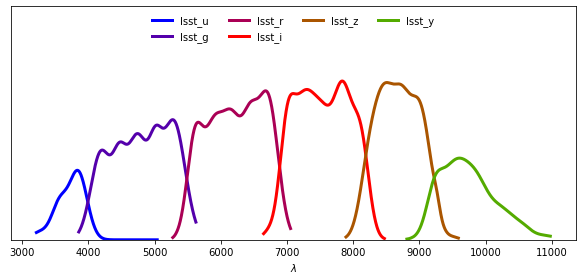

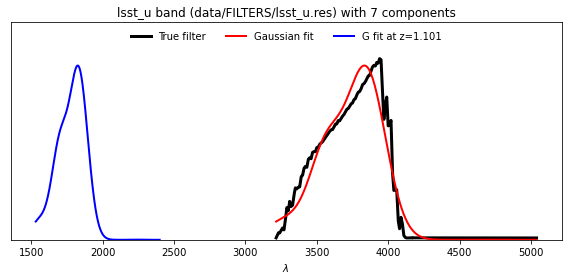

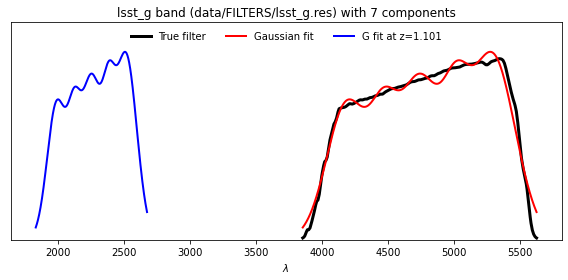

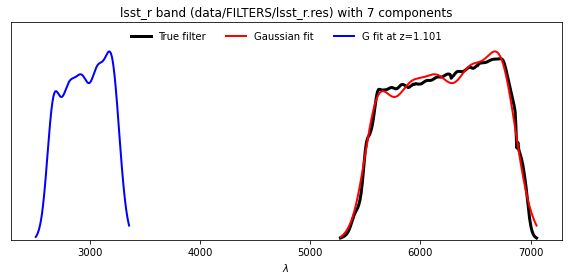

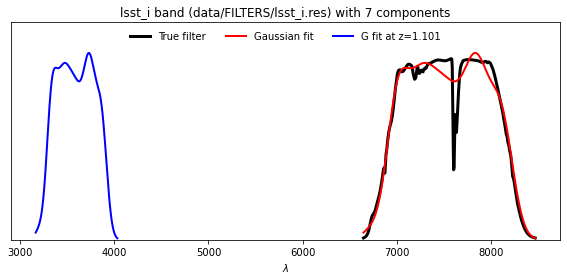

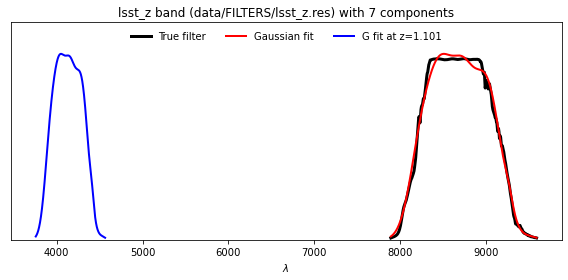

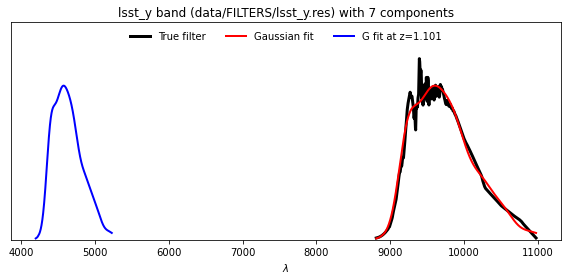

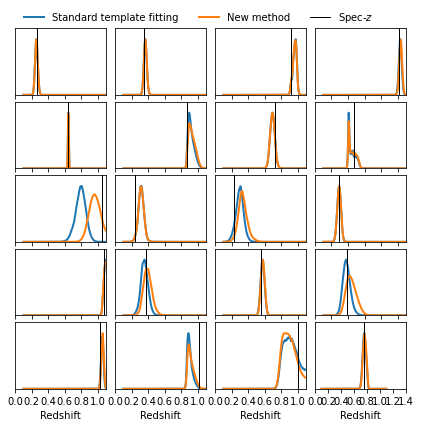

In [31]:
ncol = 4
fig, axs = plt.subplots(5, ncol, figsize=(7, 6), sharex=True, sharey=False)
axs = axs.ravel()
z = fluxredshifts[:, redshiftColumn]
sel = np.random.choice(nobj, axs.size, replace=False)
lw = 2
for ik in range(axs.size):
    k = sel[ik]
    print(k, end=" ")
    axs[ik].plot(redshiftGrid, pdfs_cww[k, :],lw=lw, label='Standard template fitting')# c="#2ecc71", 
    axs[ik].plot(redshiftGrid, pdfs[k, :], lw=lw, label='New method')  #, c="#3498db"
    axs[ik].axvline(fluxredshifts[k, redshiftColumn], c="k", lw=1, label=r'Spec-$z$')
    ymax = np.max(np.concatenate((pdfs[k, :], pdfs_cww[k, :])))
    axs[ik].set_ylim([0, ymax*1.2])
    axs[ik].set_xlim([0, 1.1])
    axs[ik].set_yticks([])
    axs[ik].set_xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4])
for i in range(ncol):
    axs[-i-1].set_xlabel('Redshift', fontsize=10)
axs[0].legend(ncol=3, frameon=False, loc='upper left', bbox_to_anchor=(0.0, 1.4))
fig.tight_layout()
fig.subplots_adjust(wspace=0.1, hspace=0.1, top=0.96)


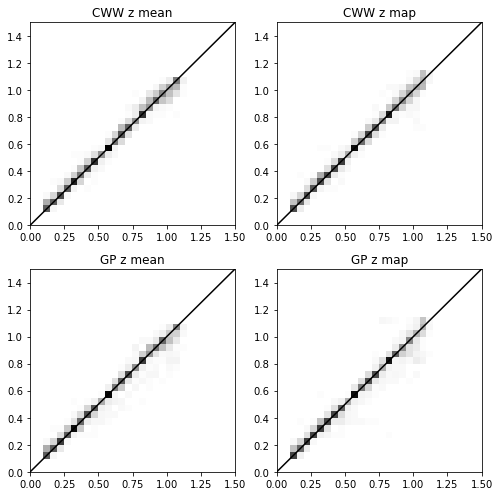

In [32]:
fig, axs = plt.subplots(2, 2, figsize=(7, 7))
zmax = 1.5
rr = [[0, zmax], [0, zmax]]
nbins = 30
h = axs[0, 0].hist2d(metricscww[:, i_zt], metricscww[:, i_zm], nbins, cmap='Greys', range=rr)
hmin, hmax = np.min(h[0]), np.max(h[0])
axs[0, 0].set_title('CWW z mean')
axs[0, 1].hist2d(metricscww[:, i_zt], metricscww[:, i_zmap], nbins, cmap='Greys', range=rr, vmax=hmax)
axs[0, 1].set_title('CWW z map')
axs[1, 0].hist2d(metrics[:, i_zt], metrics[:, i_zm], nbins, cmap='Greys', range=rr, vmax=hmax)
axs[1, 0].set_title('GP z mean')
axs[1, 1].hist2d(metrics[:, i_zt], metrics[:, i_zmap], nbins, cmap='Greys', range=rr, vmax=hmax)
axs[1, 1].set_title('GP z map')
axs[0, 0].plot([0, zmax], [0, zmax], c='k')
axs[0, 1].plot([0, zmax], [0, zmax], c='k')
axs[1, 0].plot([0, zmax], [0, zmax], c='k')
axs[1, 1].plot([0, zmax], [0, zmax], c='k')
fig.tight_layout()

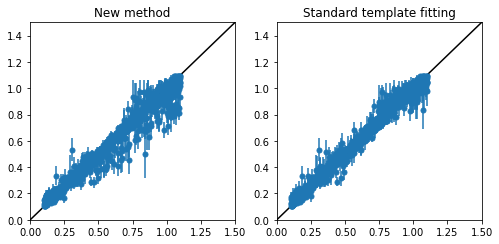

In [33]:
fig, axs = plt.subplots(1, 2, figsize=(7, 3.5))
chi2s = ((metrics[:, i_zt] - metrics[:, i_ze])/metrics[:, i_std_ze])**2

axs[0].errorbar(metrics[:, i_zt], metrics[:, i_ze], yerr=metrics[:, i_std_ze], fmt='o', markersize=5, capsize=0)
axs[1].errorbar(metricscww[:, i_zt], metricscww[:, i_ze], yerr=metricscww[:, i_std_ze], fmt='o', markersize=5, capsize=0)
axs[0].plot([0, zmax], [0, zmax], 'k')
axs[1].plot([0, zmax], [0, zmax], 'k')
axs[0].set_xlim([0, zmax])
axs[1].set_xlim([0, zmax])
axs[0].set_ylim([0, zmax])
axs[1].set_ylim([0, zmax])
axs[0].set_title('New method')
axs[1].set_title('Standard template fitting')

fig.tight_layout()

Text(0.5, 1.0, 'New method')

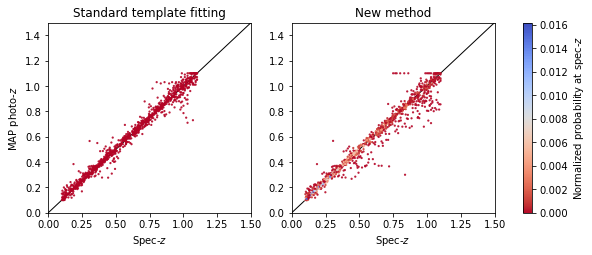

In [34]:
cmap = "coolwarm_r"
vmin = 0.0
alpha = 0.9
s = 5
fig, axs = plt.subplots(1, 2, figsize=(10, 3.5))
vs = axs[0].scatter(metricscww[:, i_zt], metricscww[:, i_zmap], 
                    s=s, c=pdfatZ_cww, cmap=cmap, linewidth=0, vmin=vmin, alpha=alpha)
vs = axs[1].scatter(metrics[:, i_zt], metrics[:, i_zmap], 
                    s=s, c=pdfatZ, cmap=cmap, linewidth=0, vmin=vmin, alpha=alpha)
clb = plt.colorbar(vs, ax=axs.ravel().tolist())
clb.set_label('Normalized probability at spec-$z$')
for i in range(2):
    axs[i].plot([0, zmax], [0, zmax], c='k', lw=1, zorder=0, alpha=1)
    axs[i].set_ylim([0, zmax])
    axs[i].set_xlim([0, zmax])
    axs[i].set_xlabel('Spec-$z$')
axs[0].set_ylabel('MAP photo-$z$')

axs[0].set_title('Standard template fitting')
axs[1].set_title('New method')

## Conclusion
Don't be too harsh with the results of the standard template fitting or the new methods since both have a lot of parameters which can be optimized!

If the results above made sense, i.e. the redshifts are reasonnable for both methods on the mock data, then you can start modifying the parameter files and creating catalog files containing actual data! I recommend using less than 20k galaxies for training, and 1000 or 10k galaxies for the delight-apply script at the moment. Future updates will address this issue.